
# Lending club risk adjusted interest rate prediction

### QUESTION phase:
    define problem
### MODELING phase:
    clean data
    explore data
    build model
### VALIDATION phase:
    validate model
### CONCLUSION phase:
    analysis result

## read data

In [1]:
loan <- read.csv("loan.csv", stringsAsFactors = FALSE)
head(loan, 3)

id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,⋯,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
1077501,1296599,5000,5000,4975,36 months,10.65,162.87,B,B2,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1077430,1314167,2500,2500,2500,60 months,15.27,59.83,C,C4,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1077175,1313524,2400,2400,2400,36 months,15.96,84.33,C,C5,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


## QUESTION phase
    rough ideas :
        predict the grade or sub_grade assigned by LC(classification problem)
        predict the loan_status (classification problem)
        predict int_rate(interest rate loan) (regression problem)
    these problem are interested by borrowers

## MODEL phase
    rough ideas:
    clean data
    explore data
        variable identification
        missing value treatment
        variable analysis
        feature engineering
    build a regression model

## clean data
    since this data is already table like, we can skip this step

## explore data
    variable identification
        type of variable: predictors(features), response(target)
        data type: character, numeric, object
        variable category: continuous, categorical

### type of variable

In [2]:
# int_rate is the response
response = loan$int_rate
# all others are features, where `which` find the index of column "int_rate"
features = loan[, -which(names(loan) == "int_rate")]

### data type
    numerical
        continous : e.g. int_rate
        discrete : e.g. inq_fi(Number of personal finance inquiries)
    categorical
        ordinal : e.g. grade
        nominal : e.g. zip code
    ATTENTION: data type may not like the type it loaded into

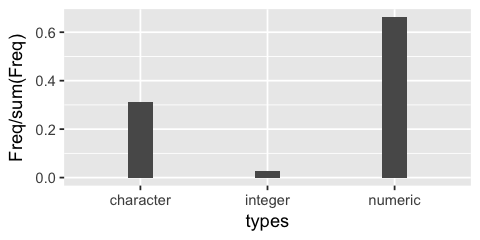

In [3]:
# load library
library(ggplot2)

# apply function class to all load columns
types = sapply(loan, class)

# convert types to data.frame
# `table` calculate the frequency
df.types = data.frame(table(types), row.names = NULL)

# visualization
options(repr.plot.width=4, repr.plot.height=2)
ggplot(data = df.types,
       aes(x = types, y = Freq/sum(Freq))) + 
geom_bar(stat = "identity", width = 0.2)

In [4]:
# Check variable one by one

# addr_state(categorical: nomial)
# emp_length(numeric: discrete ) change from string to integer
substr(loan$emp_length[1], 1, 2) # not numerical
    # deinfe a function extract numbers from string
str2num <- function(str){as.numeric(gsub("([^0-9])", "", str))}
loan$emp_length = sapply(loan$emp_length, str2num)
# emp_title(categorical: nominal)
# home_ownership (categorical: nominal)
# member_id(categorical: nominal)
# zip_code(categorical: nominal)
# annual_inc(numerical: continuous)
# annual_inc_joint(numerical: continuous)
# is_inc_v(binary) : missing feature
# verified_status_joint(categorical: nominal)
    # unique(loan$verification_status_joint)
# dti(numerical: continous)
# dti_joint(numerical: continous)
# earliest_cr_line(categorica:nominal) could be splitted to year and mon
library(zoo)
loan$earliest_cr_line_date = as.Date(as.yearmon(loan$earliest_cr_line, "%b-%Y"))
loan$earliest_cr_line_year = format(loan$earliest_cr_line_date, "%Y")
loan$earliest_cr_line_mon = format(loan$earliest_cr_line_date, "%m")
# fico_range_high: missing
# fico_range_low: missing
# last_fico_range_high: missing
# last_fico_range_low: missing
# inq_fi(numerical : discrete)
# inq_last_12m(numerical : discrete)
# inq_last_6mths(numerical : discrete)
# last_credit_pull_d(categorical) could be splitted to year and mon
loan$last_credit_pull_d_date = as.Date(as.yearmon(loan$last_credit_pull_d, "%b-%Y"))
loan$last_credit_pull_d_year = format(loan$last_credit_pull_d_date, "%Y")
loan$last_credit_pull_d_mon = format(loan$last_credit_pull_d_date, "%m")
# total_acc(numerical : discrete)
# tot_cur_bal(numerical : continous)   
# all_util(numerical : continous)
# open_acc(numerical : discrete)
# total_acc(numerical : discrete)
# tot_cur_bal(numerical : continous)
# all_util(numerical : continous)
# open_acc(numerical : discrete)
# open_acc_6m(numerical : discrete)
# total_cu_tl(numerical : discrete)
# acc_noew_delinq(numerical : discrete)
# delinq_2yrs(numerical : discrete)
# mths_since_last_delinq(numerical : discrete)
# collections_12_mths_ex_med(numerical : discrete)
# tot_coll_amt(numerical : discrete)
# pub_rec(numerical : discrete)
# mths_since_last_major_derog(numerical : discrete)
# mths_since_last_record(numerical : discrete)
# il_util(numerical : continuous)
# mths_since_rcnt_il(numerical : discrete)
# open_il_12m(numerical : discrete)
# open_il_24m(numerical : discrete)
# open_il_6m(numerical : discrete)
# total_bal_il(numerical : continuous)
# max_bal_bc(numerical : continuous)
# open_rv_12m(numerical : discrete)
# open_rv_24m(numerical : discrete)
# revol_bal(numerical : continuous)
# revol_util(numerical : continuous)
# total_rev_hi_lim(numerical : continuous)
# policy_code(binary) : no use, unique value
# url(string): not useful
# application_type(categorical : nominal)
# desc(string) might be useful, but need nlp
# id : not useful
# purpose(categorical : nominal)
# term(categorical : nominal)
# title(string) might be useful, but need nlp
# issue_d(categorical) could be splitted to year and mon
loan$issue_d_date = as.Date(as.yearmon(loan$issue_d, "%b-%Y"))
loan$issue_d_year = format(loan$issue_d_date, "%Y")
loan$issue_d_mon = format(loan$issue_d_date, "%m")
# inital_list_status(binary)
# loan_amnt(numerical : continuous)
# installment(numerical : continuous)
# funded_amnt(numerical : continuous)
# funded_amnt_inv(numerical : continuous)
# last_pymnt_amnt(numerical : continuous)
# last_pymnt_d(categorical)
loan$last_pymnt_d_date = as.Date(as.yearmon(loan$last_pymnt_d, "%b-%Y"))
loan$last_pymnt_d_year = format(loan$last_pymnt_d_date, "%Y")
loan$last_pymnt_d_mon = format(loan$last_pymnt_d_date, "%m")
# next_pymnt_d(categorical)
loan$next_pymnt_d_date = as.Date(as.yearmon(loan$next_pymnt_d, "%b-%Y"))
loan$next_pymnt_d_year = format(loan$next_pymnt_d_date, "%Y")
loan$next_pymnt_d_mon = format(loan$next_pymnt_d_date, "%m")
# pymnt_plan(binary)
# recoveries(numerical : continuous)
# total_pymnt(numerical : continuous)
# total_pymnt_inv(numerical : continuous)
# total_rec_int(numerical : continuous)
# total_rec_late_fee(numerical : continuous)
# total_rec_prncp(numerical : continuous)
# collection_recovery_fee(numerical : continuous)
# out_prncp(numerical : continuous)
# out_prncp_inv(numerical : continuous)

# Potential response variables -------------------------------

# grade(categorical : ordinal)
#   plot(table(loan$grade))

# sub_grade(categorical : ordinal)
#   plot(table(loan$sub_grade))

# int_rate(numerical : continuous)
#   hist(loan$int_rate)

# loan_status(categorical : nominal)
#   unique(loan$loan_status)

[1] "10"


Attaching package: ‘zoo’

The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric



### variable analysis 
	univariate analysis
	▪	continuous
	▪	categorical
	bi-variate analysis
	▪	continuous & continuous
	▪	categorical & categorical
	▪	continuous & categorical
### common analysis tool:
	•	common statistics : mean, median, skewness, ...
	•	data visualization : barplot, histogram, density plot, ...
	•	hpyothesis test : Chi2-test, anova, t-test, ...
    
Since we focus on int_rate, which is response, basicly, we can think, what we are doing is try to estimate the density of  P(response|features)P(response|features) 
int_rate : Interest Rate on the loan
since this is continuous variable, we can look at its basic stats, and histogram, density plot, boxplot

In [5]:
# stats
"range and quantile"
summary(loan$int_rate)

"sd"
sd(loan$int_rate)

[1] "range and quantile"

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   5.32    9.99   12.99   13.25   16.20   28.99 

[1] "sd"

[1] 4.381867

analysis: positive skew, but not strong, which means we could could use nomarl distribution to model this curve, but we need more analysis

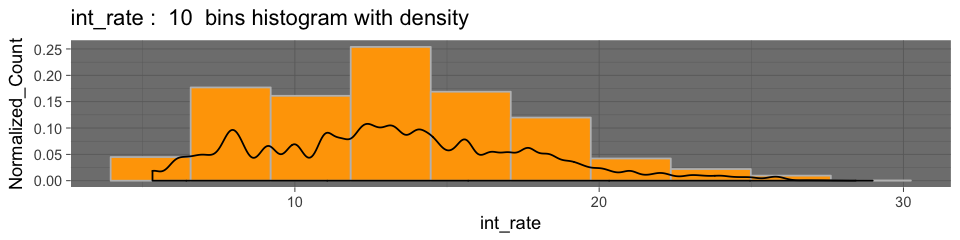

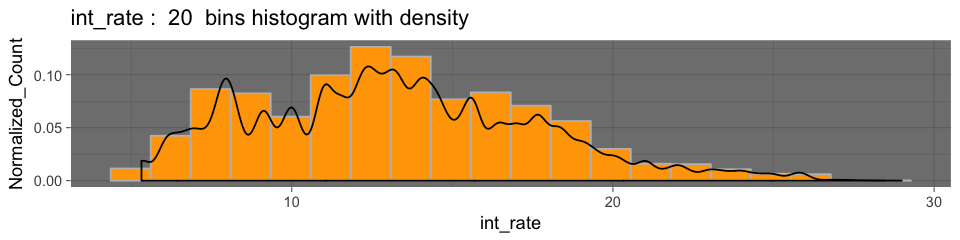

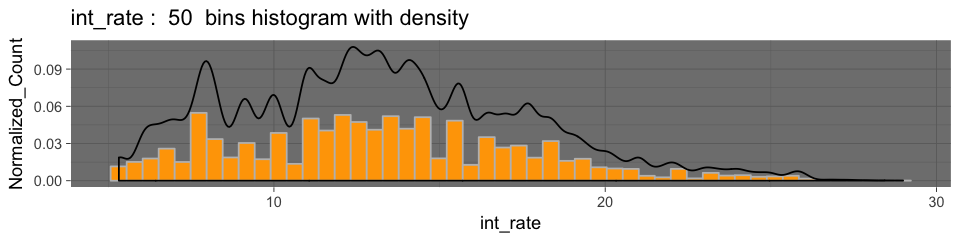

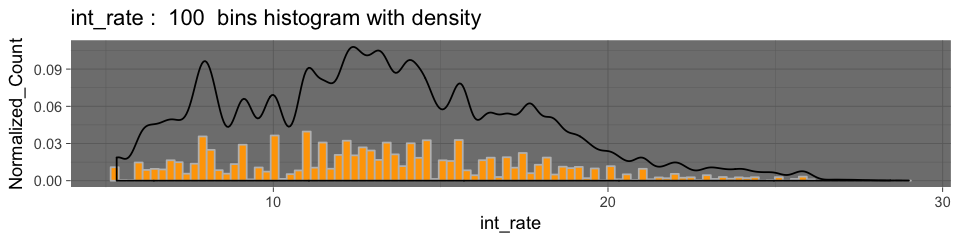

In [6]:
plothistdensity <- function(data, nbins){
    options(repr.plot.width=8, repr.plot.height=2)
    p <- ggplot(data, aes(x=int_rate, y = ..density..))
    p <- p + geom_histogram(aes(y=..count../sum(..count..)),
                           bins = nbins,
                           color = "grey",
                           fill="orange")
    p <- p + geom_density()
    p + theme_dark() + 
    ylab("Normalized_Count") + 
    ggtitle(paste(paste("int_rate : ", nbins), " bins histogram with density" ))  
}

plothistdensity(loan, 10)
plothistdensity(loan, 20)
plothistdensity(loan, 50)
plothistdensity(loan, 100)

analysis: usually histogram could roughly estimate pdf of a random variable, however, to get more stable and generalize result we could use KDE to estimate density of a random variable. From the density plot, we observe many peaks, which indicates this a multimodal distribution. This means there are different patterns inside the distribution, usually, it is a mixture distribution. This pattern may cause by groups(usage, years, repuations, states, ...)

### Obvious groups in the features are categorical variables

### Group analysis on int_rate 

### 1. int_rate with grade 
    
    int_rate : Interest Rate on the loan
    
    grade : LC assigned loan grade

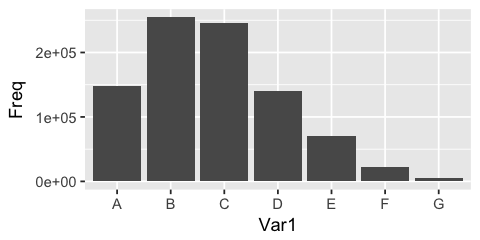

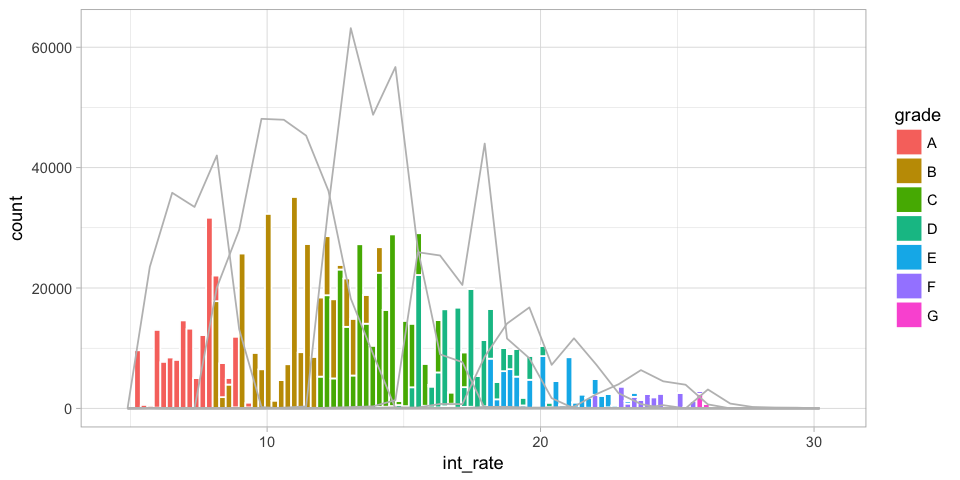

In [7]:
options(repr.plot.width=4, repr.plot.height=2)
ggplot(data.frame(table(loan$grade)), aes(x=Var1, y=Freq)) + geom_bar(stat = "identity")
# group histogram
options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x=int_rate, fill=grade)) + 
geom_histogram(bins = 100, color = "white") + theme_light() + 
geom_freqpoly(bins = 30, color = "grey")

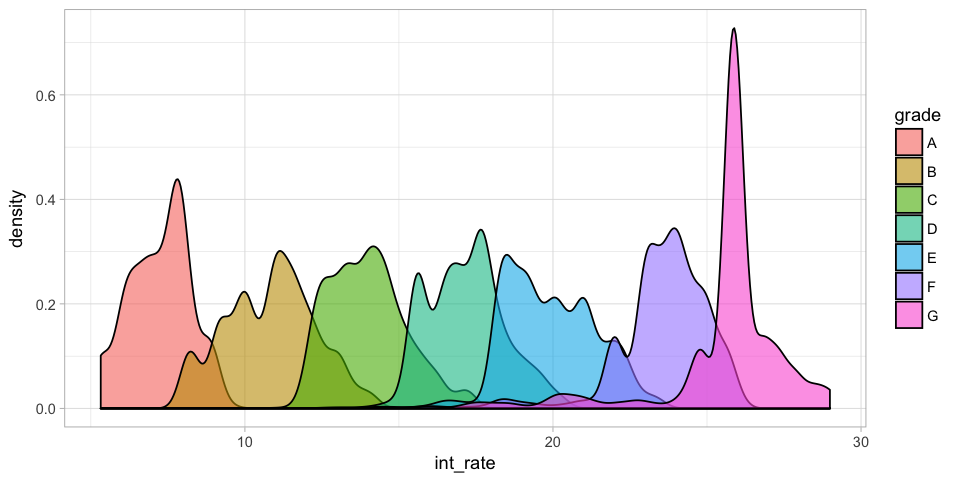

In [8]:
# group density
options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x=int_rate, y= ..density.., fill=grade)) + 
theme_light() + 
geom_density(bw = 0.3, alpha= 0.6)

Even we group int_rate by grade, it still shows multimodality inside each group, we can dig into it latter, but, clearly it shows grade was directly related to int_rate

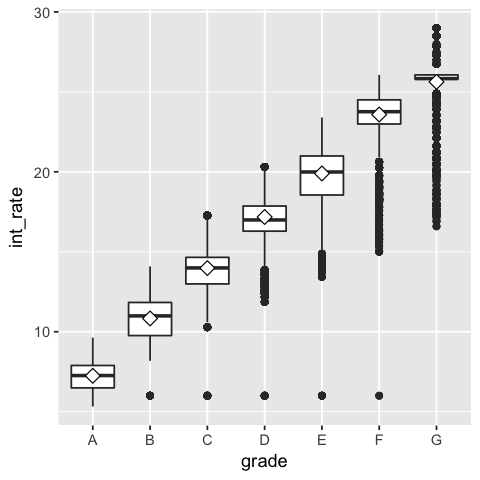

In [9]:
# boxplot 1
options(repr.plot.width=4, repr.plot.height=4)
ggplot(loan, aes(x=factor(grade), y=int_rate)) + 
geom_boxplot() + labs(x='grade') + 
stat_summary(fun.y="mean", geom="point", shape=23, size=3, fill="white")

box plot shows the skewness, quantile, outliers of each group, but it cannot show the amount of data in each group

In [10]:
table(loan$grade)



     A      B      C      D      E      F      G 
148202 254535 245860 139542  70705  23046   5489 

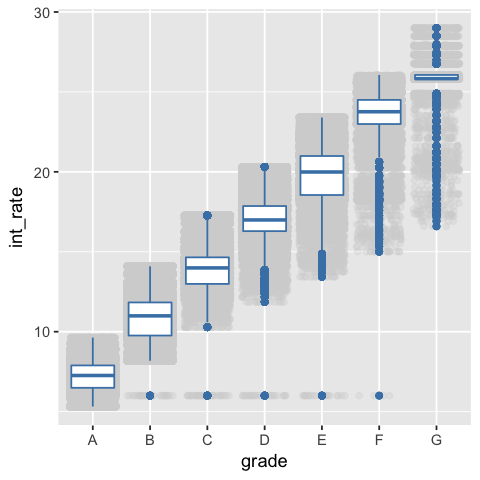

In [11]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(loan, aes(x=factor(grade), y=int_rate)) + 
geom_jitter(alpha=0.3, color='lightgrey') +
geom_boxplot(color='steelblue') + 
labs(x='grade')

we can also use a violin plot to compare multiple distribution in different group

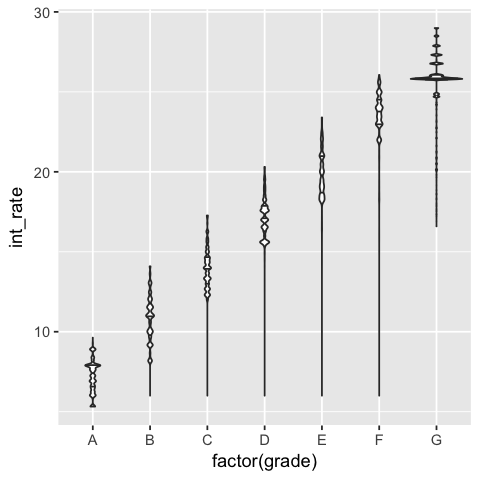

In [12]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(loan, aes(x=factor(grade), y=int_rate)) +
geom_violin(draw_quantiles = c(0.25, 0.5, 0.75)) #+ geom_boxplot(width=.1, fill="black", outlier.colour=NA) +
#stat_summary(fun.y=median, geom="point", fill="white", shape=21, size=2.5)

### 2. int_rate with subgrade

     int_rate : Interest Rate on the loan

     subgrade : LC assigned loan subgrade

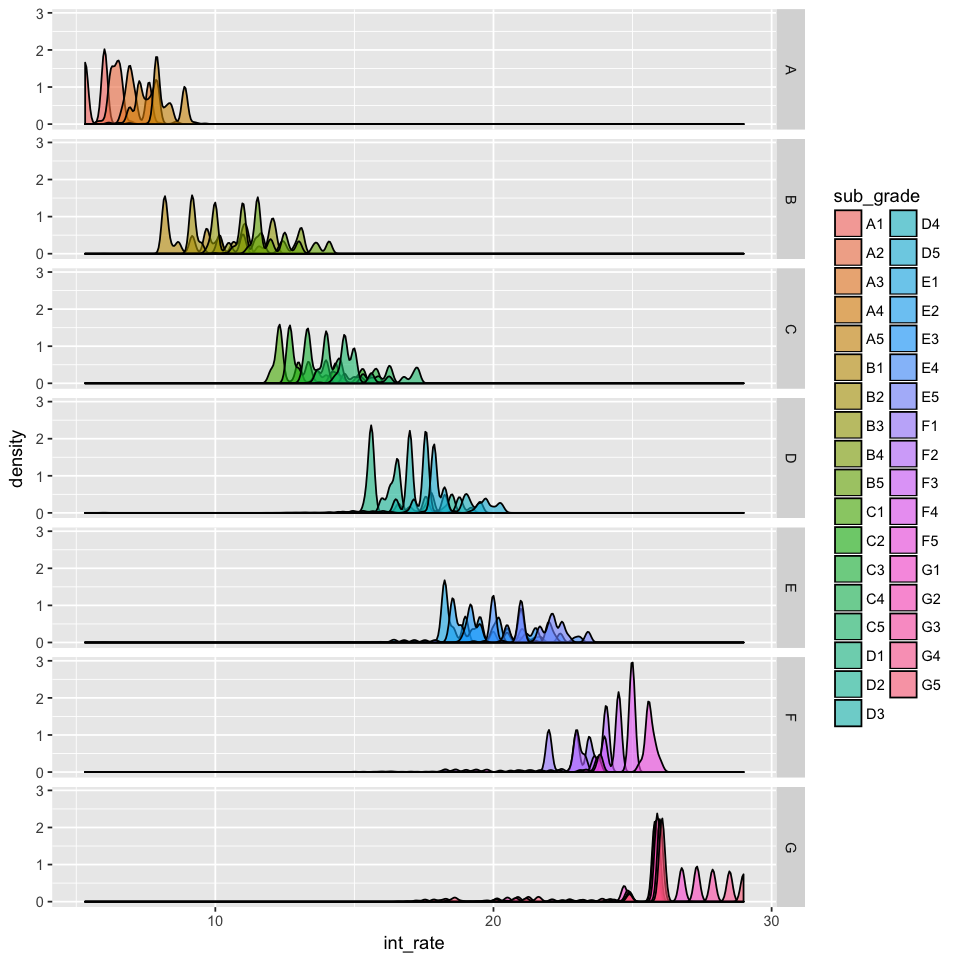

In [13]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(loan, aes(x=int_rate, y=..density.., fill = sub_grade)) +
geom_density(bw = 0.1, alpha= 0.6) + facet_grid(grade ~ .)

### 3. int_rate with loan_status 
    int_rate : Interest Rate on the loan
    loan_status : Current status of the loan

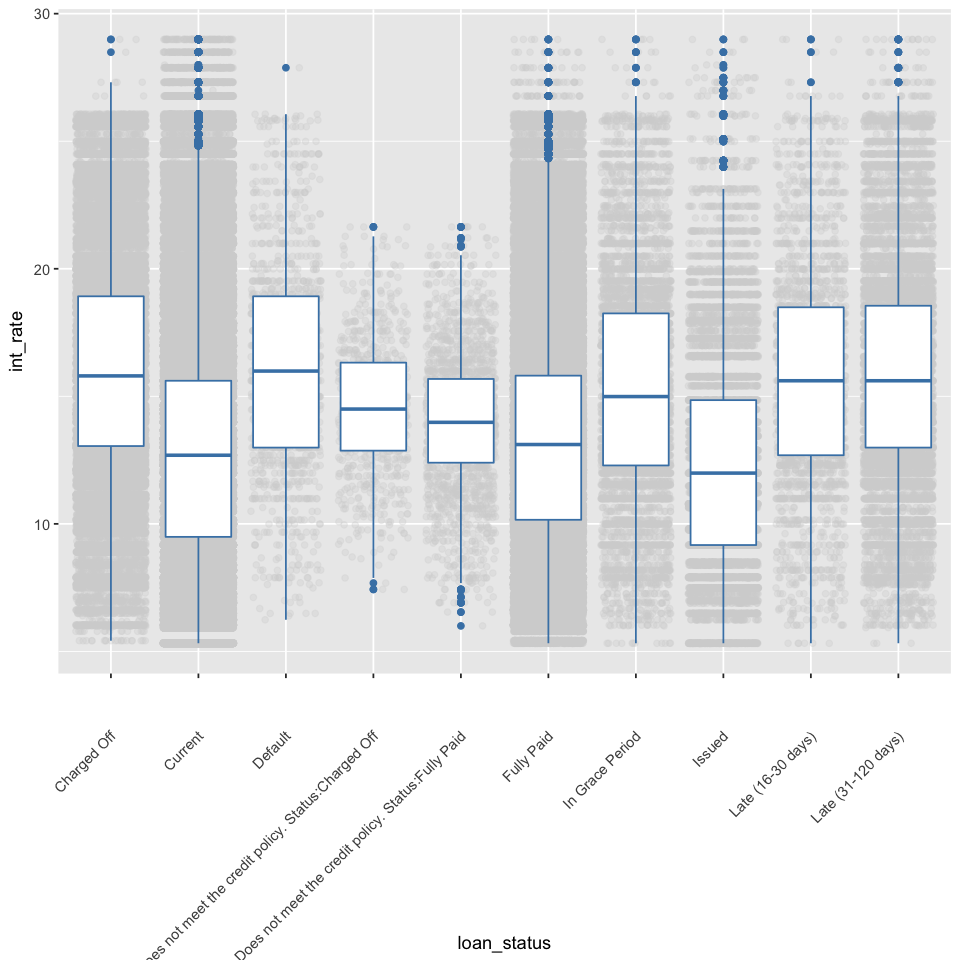

In [14]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(loan, aes(x=factor(loan_status), y=int_rate)) + 
geom_jitter(alpha=0.3, color='lightgrey') +
geom_boxplot(color='steelblue') + 
labs(x='loan_status') + 
theme(axis.text.x = element_text(angle=45, hjust=1, vjust=0.8),legend.position = "none")

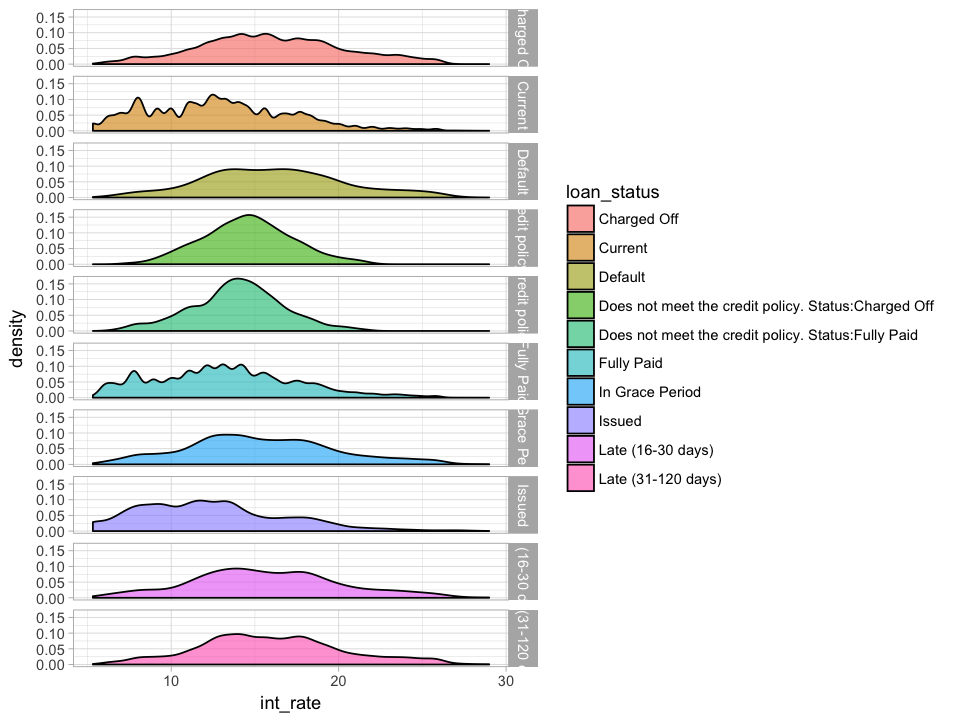

In [15]:
options(repr.plot.width=8, repr.plot.height=6)
ggplot(loan, aes(x=int_rate, y= ..density.., fill=loan_status)) + 
theme_light() + 
facet_grid(loan_status ~ .) +
geom_density(alpha= 0.6)

int_rate also influence by loan_status, and within each loan_status group, it appears more like a normal

## USER FEATURES vs int_rate 

### 4. addr_state with int_rate 

Loading required package: acs
Loading required package: stringr
Loading required package: XML

Attaching package: ‘acs’

The following object is masked from ‘package:base’:

    apply



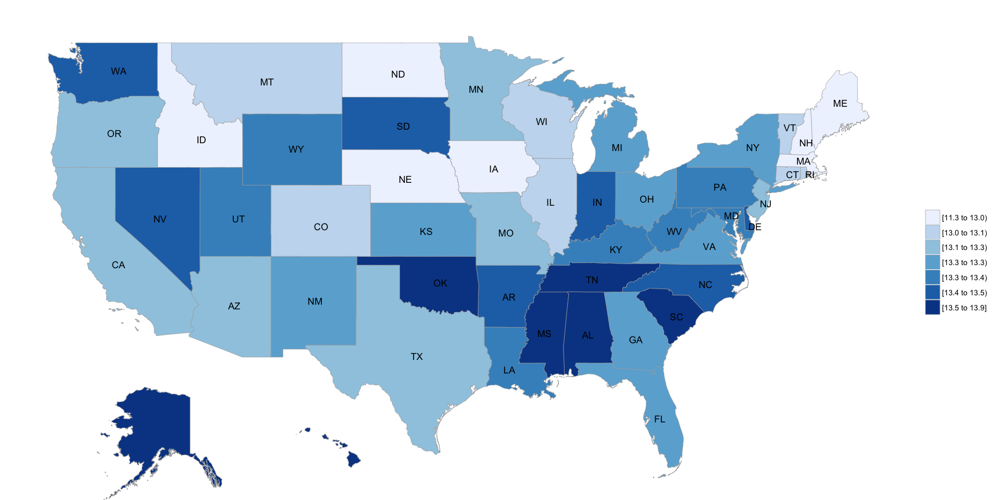

In [16]:
library(choroplethr)
library(choroplethrMaps)

state.ave.int_rate = as.list(by(loan$int_rate, loan$addr_state, mean))
state.names = names(state.ave.int_rate)
names(state.ave.int_rate) = NULL
state.int_rate.df = data.frame(region = state.names, value = unlist(state.ave.int_rate))

full.name = c()
for(i in 1:51)
{
    if(i==8){
        full.name <- append(full.name, "district of columbia")
    }else{
        full.name <- append(full.name, tolower(state.name[state.int_rate.df[i,1] == state.abb]))
    }
}

state.int_rate.df$region = full.name

options(repr.plot.width=16, repr.plot.height=8)
state_choropleth(state.int_rate.df)

In [17]:
# anova analysis on different groups
aov.res = aov(int_rate ~ factor(addr_state), na.action = na.omit, data = loan)
summary(aov.res)

                       Df   Sum Sq Mean Sq F value Pr(>F)    
factor(addr_state)     50    26795   535.9   27.95 <2e-16 ***
Residuals          887328 17011539    19.2                   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

    As the p-value is less than the significance level 0.001, we can conclude that there are significant differences between the groups. 

    possible feature enigneering:
        group median of int_rate on each state
        set level of int_rate on each state

### 5. emp_length with int_rate 
    emp_length with int_rate : Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.

In [18]:
unique(loan$emp_length)

[1] 10  1  3  8  9  4  5  6  2  7 NA

In [19]:
loan[which(loan$emp_length == "n/a"), "emp_length"] <- NA
sum(is.na(loan$emp_length))/dim(loan)[1]

[1] 0.05051393

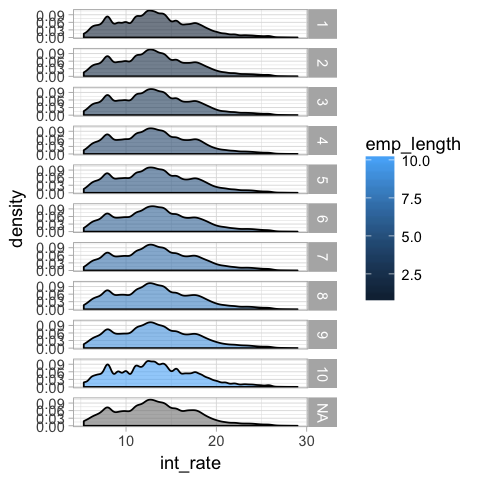

In [20]:
# group density
options(repr.plot.width=4, repr.plot.height=4)
ggplot(loan, aes(x=int_rate, y= ..density.., fill=emp_length)) + 
theme_light() + 
facet_grid(emp_length ~ .) +
geom_density(alpha= 0.6)

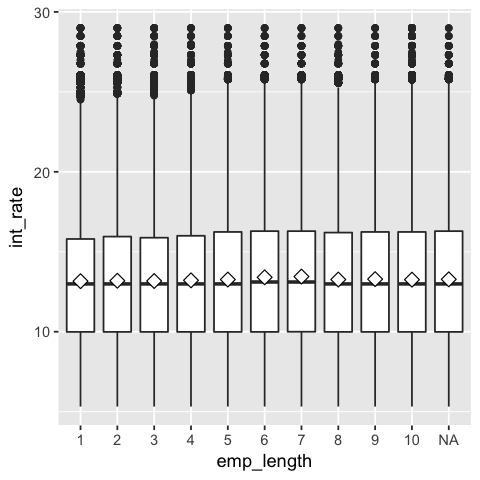

In [21]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(loan, aes(x=factor(emp_length), y=int_rate)) + 
geom_boxplot() + labs(x='emp_length') + 
stat_summary(fun.y="mean", geom="point", shape=23, size=3, fill="white")

In [22]:
# anova analysis on different groups
aov.res = aov(int_rate ~ factor(emp_length), na.action = na.omit, data = loan, )
summary(aov.res)


                       Df   Sum Sq Mean Sq F value Pr(>F)    
factor(emp_length)      9     4667   518.6   26.97 <2e-16 ***
Residuals          842544 16202138    19.2                   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1
44825 observations deleted due to missingness

In [23]:
# Tukey test to find significance between groups
tukey.res = TukeyHSD(aov.res, conf.level = 0.95)                   
tukey.res

  Tukey multiple comparisons of means
    95% family-wise confidence level

Fit: aov(formula = int_rate ~ factor(emp_length), data = loan, na.action = na.omit)

$`factor(emp_length)`
              diff          lwr         upr     p adj
2-1   0.0275563392 -0.035273391  0.09038607 0.9313745
3-1   0.0105064267 -0.054729933  0.07574279 0.9999664
4-1   0.0533839088 -0.018527908  0.12529573 0.3574399
5-1   0.1029239235  0.032479163  0.17336868 0.0001638
6-1   0.2421105663  0.164725163  0.31949597 0.0000000
7-1   0.2887307876  0.212420278  0.36504130 0.0000000
8-1   0.1030346301  0.026314103  0.17975516 0.0008972
9-1   0.1289560620  0.044927387  0.21298474 0.0000526
10-1  0.0956418964  0.049087233  0.14219656 0.0000000
3-2  -0.0170499125 -0.089084135  0.05498431 0.9991740
4-2   0.0258275696 -0.052303448  0.10395859 0.9893992
5-2   0.0753675843 -0.001415297  0.15215047 0.0594696
6-2   0.2145542271  0.131357789  0.29775066 0.0000000
7-2   0.2611744484  0.178976879  0.34337202 0.0000000
8-2   0

In [24]:
# feature engineering : split emp_length to < 5 ; >= 5
loan$emp_length_sim = NA
loan[which(is.na(loan[,'emp_length'])),'emp_length']=median(loan[,'emp_length'],na.rm=T)
loan[which(loan$emp_length %in% c('10', '8','9','5','6','7')), "emp_length_sim"] = ">= 5"
loan[which(loan$emp_length %in% c('0', '1','2','3','4')), "emp_length_sim"] = "< 5"

In [25]:
table(loan$emp_length_sim)


   < 5   >= 5 
329125 558254 

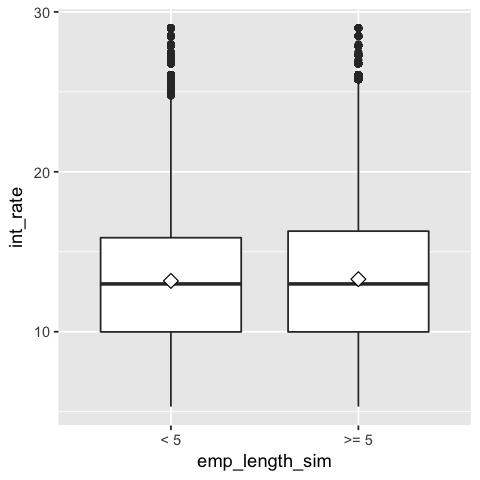

In [26]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(loan, aes(x=factor(emp_length_sim), y=int_rate)) + 
geom_boxplot() + labs(x='emp_length_sim') + 
stat_summary(fun.y="mean", geom="point", shape=23, size=3, fill="white")

In [27]:
# t-test on group means
t.test(int_rate ~ emp_length_sim, data = loan, na.action = na.omit) # significant


	Welch Two Sample t-test

data:  int_rate by emp_length_sim
t = -11.472, df = 698310, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.1288463 -0.0912435
sample estimates:
 mean in group < 5 mean in group >= 5 
          13.17751           13.28755 


### 6. emp_title with int_rate
    nominal

In [28]:
# display top ten emp_title
loan$emp_title = tolower(loan$emp_title)            # convert all string to lowercase
# convert " " to na
loan$emp_title[which(loan$emp_title == "")] = NA
sort(table(loan$emp_title), decreasing = T)[1:100]   # possible text processing, na exists as a level
length(unique(loan$emp_title))
# percentage of missing 
sum(is.na(loan$emp_title))/dim(loan)[1]


                 teacher                  manager                    owner 
                   16619                    14963                     8586 
        registered nurse               supervisor                   driver 
                    7721                     6937                     6215 
                   sales                       rn           office manager 
                    6208                     6017                     4687 
         project manager          general manager             truck driver 
                    4625                     4256                     3566 
                director                 engineer                president 
                    3427                     3186                     3094 
           sales manager           vice president           police officer 
                    2713                     2633                     2603 
      operations manager            store manager                 attorney 
           

[1] 261562

[1] 0.05798762

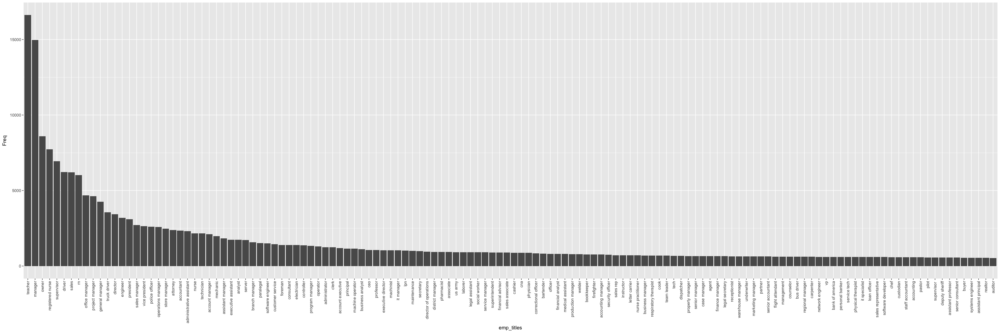

In [29]:
# bar plot 
emp_title.pop = sort(table(loan$emp_title)[which(table(loan$emp_title)>500)], decreasing = T)
emp_title.pop = as.data.frame(emp_title.pop)

options(repr.plot.width=30, repr.plot.height=10)
ggplot(data = emp_title.pop, aes(x=Var1, y=Freq)) + 
  geom_bar(stat="identity") + 
#    scale_y_log10() + 
    scale_x_discrete(name ="emp_titles", 
                     limits=emp_title.pop$Var1)+
  theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

possible feature engineering : binning

In [30]:
 # generate feature emp_title
#emp_title.ave_rate = as.list(by(loan$int_rate, loan$emp_title, median))
#emp_title.ave_rate = unlist(emp_title.ave_rate)
#loan$gen_emp_title_ave_rate = unlist(apply(loan, 1, function(x){return(emp_title.ave_rate[x["emp_title"]])}))

In [31]:
#plot(table(loan$gen_empt_title_ave_rate))

### 7. home_ownership with int_rate¶
nominal

In [32]:
unique(loan$home_ownership)


[1] "RENT"     "OWN"      "MORTGAGE" "OTHER"    "NONE"     "ANY"

In [33]:
sum(loan$home_ownership == "NONE") / dim(loan)[1]

[1] 5.634571e-05

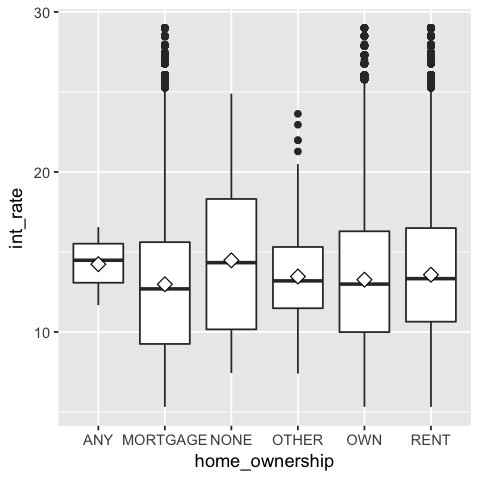

In [34]:
#boxplot 1
options(repr.plot.width=4, repr.plot.height=4)
ggplot(loan, aes(x=factor(home_ownership), y=int_rate)) + 
#geom_jitter(alpha=0.3, color='lightgrey') +
geom_boxplot() + labs(x='home_ownership') + 
stat_summary(fun.y="mean", geom="point", shape=23, size=3, fill="white")

we can observe rough trend, that mortage < own < rent

In [35]:
# binning "ANY", "NONE", "OTHER"
loan$gen_home_ownership = loan$home_ownership
loan$gen_home_ownership[loan$home_ownership %in% c("ANY", "NONE", "OTHER")] = "others"
table(loan$gen_home_ownership)


MORTGAGE   others      OWN     RENT 
  443557      235    87470   356117 

### 8. zip code with int_rate

In [36]:
sum(is.na(loan$zip_code))/dim(loan)[1]

[1] 0

In [37]:
head(table(loan$zip_code, loan$addr_state))

       
          AK   AL   AR   AZ   CA   CO   CT   DC   DE   FL   GA   HI   IA   ID
  007xx    0    0    0    0    0    0    0    0    0    1    0    0    0    0
  008xx    0    0    0    0    0    0    0    0    0    0    0    0    0    0
  010xx    0    0    0    0    0    0    1    0    0    0    0    0    0    0
  011xx    0    0    0    0    0    0    1    0    0    0    0    0    0    0
  012xx    0    0    0    0    0    0    0    0    0    0    0    0    0    0
  013xx    0    0    0    0    0    0    0    0    0    0    0    0    0    0
       
          IL   IN   KS   KY   LA   MA   MD   ME   MI   MN   MO   MS   MT   NC
  007xx    0    0    0    0    0    0    0    0    0    0    0    0    0    0
  008xx    0    0    0    0    0    0    0    0    0    0    0    0    0    0
  010xx    0    0    0    0    0 1476    0    0    0    0    0    0    0    0
  011xx    0    0    0    0    0  412    0    0    0    0    0    0    0    0
  012xx    0    0    0    0    0  346    0    0 

possible : feature engineering combine zip_code and addr_state to generate more accurate address

In [38]:
# possible : feature engineering combine zip_code and addr_state to generate more accurate address
loan$gen_add_state_zip = paste(loan$addr_state, as.character(loan$zip_code))
add_state_zip.ave_rate = as.list(by(loan$int_rate, loan$gen_add_state_zip, median))
add_state_zip.ave_rate = unlist(add_state_zip.ave_rate)
loan$gen_add_state_zip_ave_rate = unlist(apply(loan, 1, function(x){return(add_state_zip.ave_rate[x["gen_add_state_zip"]])}))

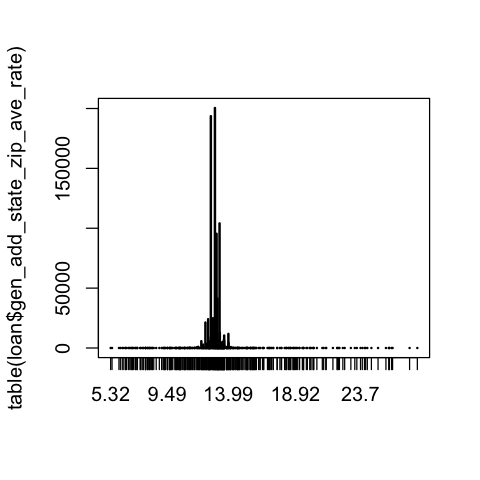

In [39]:
plot(table(loan$gen_add_state_zip_ave_rate))

## USER FEATURES (financial specific) vs int_rate
### 9. annual_inc with int_rate
    The self-reported annual income provided by the borrower during registration.

[1] 6.761485e-06

[1]    1200 9500000

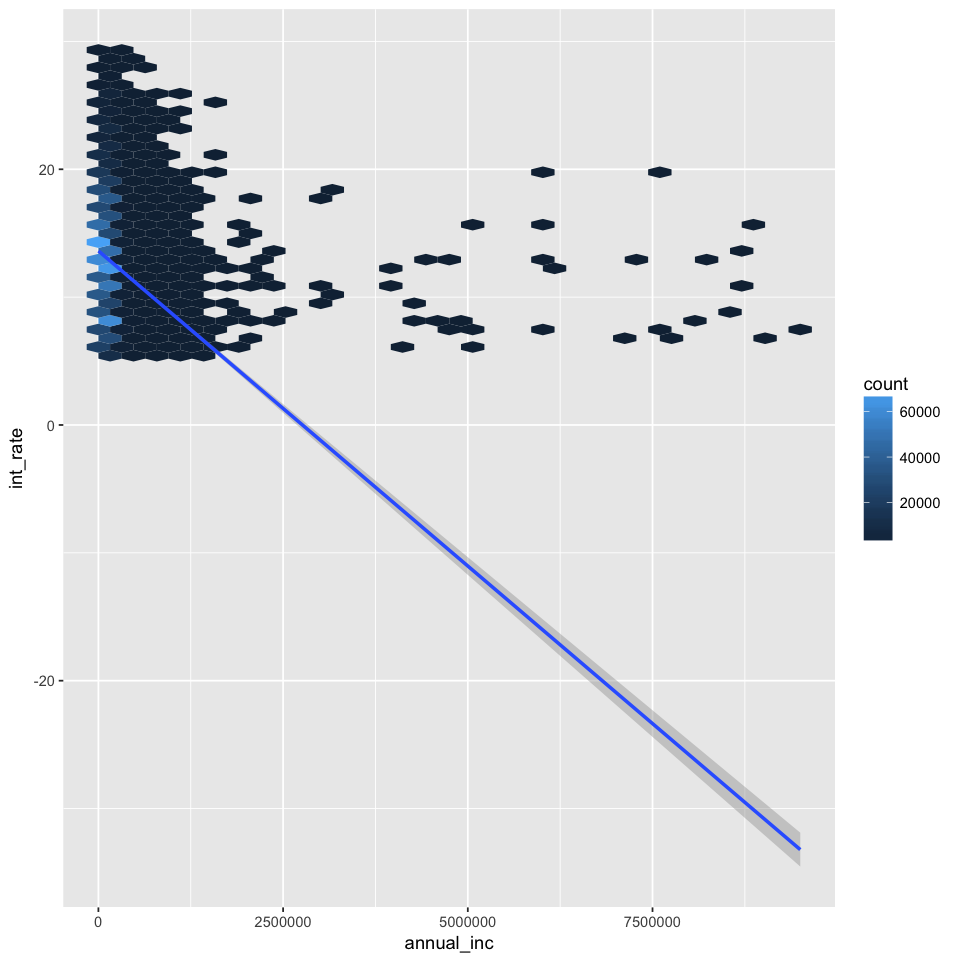

In [40]:
length(which(is.na(loan$annual_inc) | (loan$annual_inc == 0)))/dim(loan)[1]

loan$annual_inc[which(is.na(loan$annual_inc) | (loan$annual_inc == 0))] = mean(loan$annual_inc, na.rm=T)
#loan$annual_inc[which(is.na(loan$annual_inc) == 0)] = mean(loan$annual_inc, na.rm=T)
range(loan$annual_inc)

# linear relationship
options(repr.plot.width=8, repr.plot.height=8)
ggplot(loan, aes(x = annual_inc, y=int_rate)) + geom_hex() + stat_smooth(method=lm)

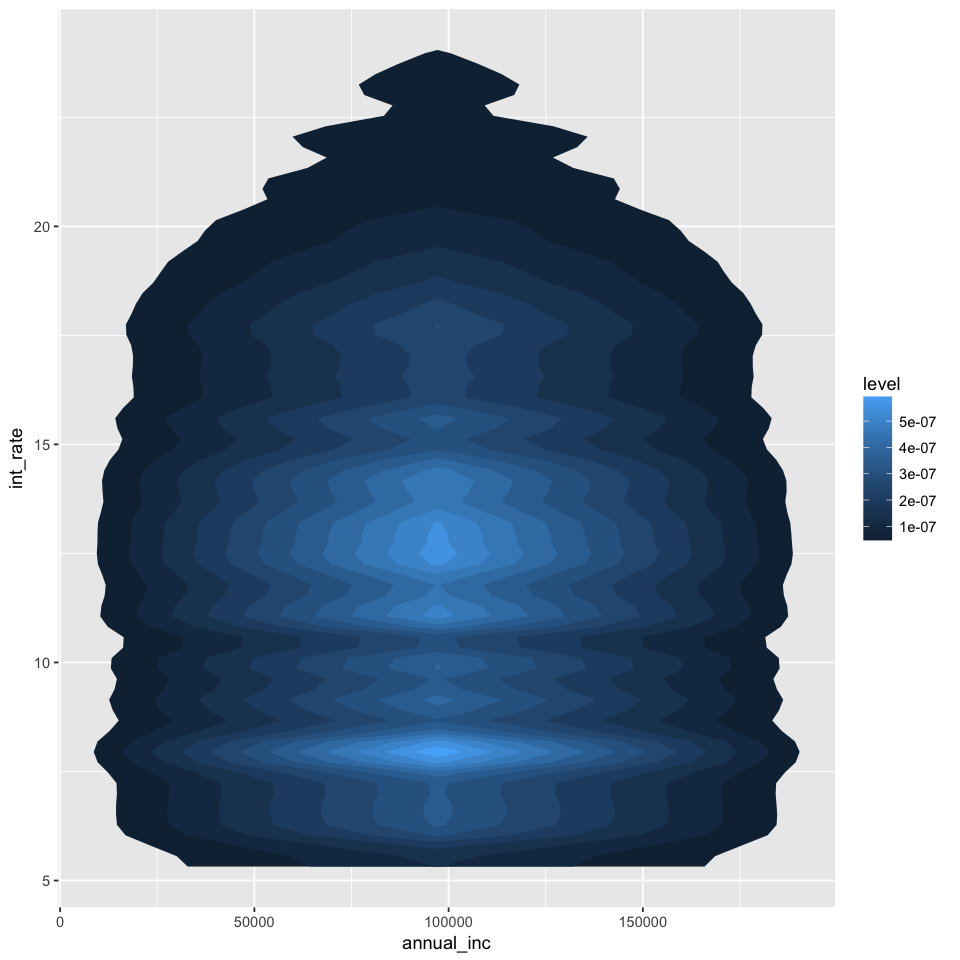

In [41]:
ggplot(loan, aes(x = annual_inc, y=int_rate)) + 
stat_density_2d(aes(fill = ..level..), geom = "polygon")

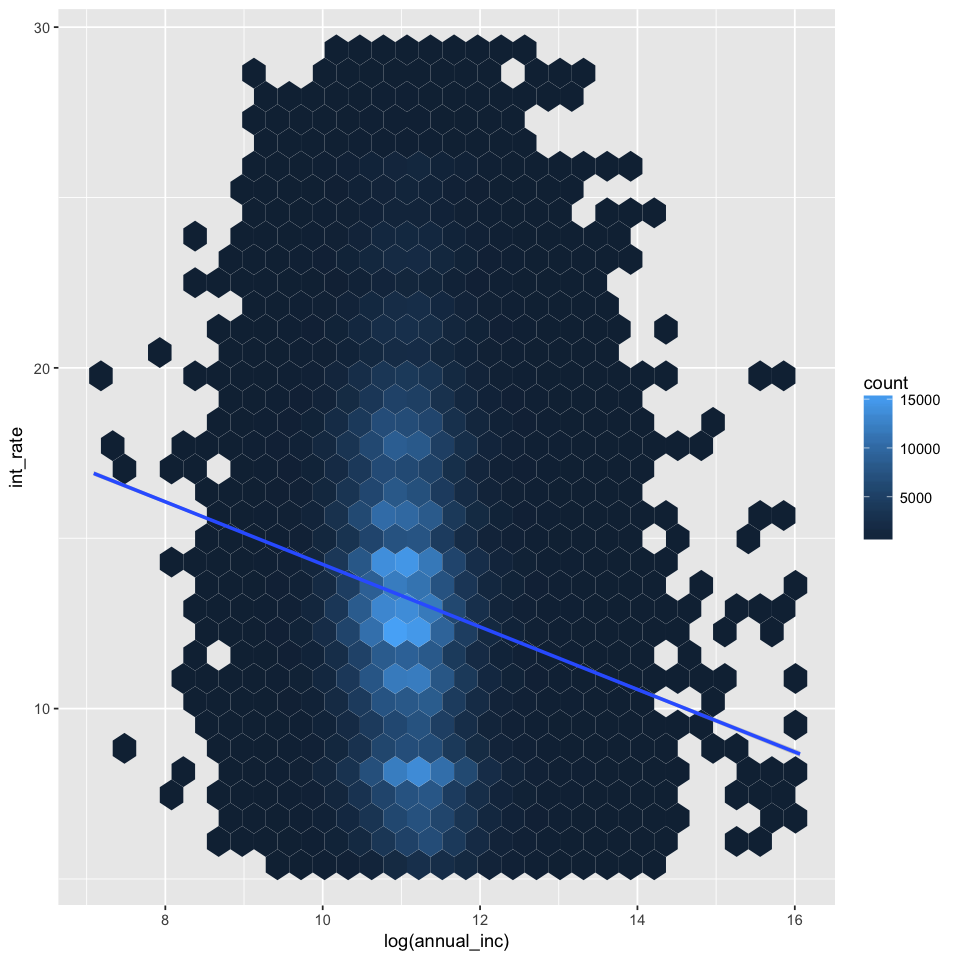

In [42]:
# linear relationship in log scale : possible feature engineering
options(repr.plot.width=8, repr.plot.height=8)
ggplot(loan, aes(x = log(annual_inc), y=int_rate)) + geom_hex() + stat_smooth(method=lm)

In [43]:
cor(loan$annual_inc, loan$int_rate)
# possible feature
cor(log(loan$annual_inc), loan$int_rate)

[1] -0.07278456

[1] -0.110645

In [44]:
# new feature
loan$gen_log_annual_inc = log(loan$annual_inc)

### 10. annual_inc_joint with int_rate
    numerical: continuous

In [45]:
# drop this feature
sum(is.na(loan$annual_inc_joint))/dim(loan)[1]

[1] 0.9994241

### 11. verified_status_joint with int_rate
    categorical: nominal

In [46]:
sum(is.na(loan$verification_status))/dim(loan)[1]
unique(loan$verification_status)


[1] 0

[1] "Verified"        "Source Verified" "Not Verified"

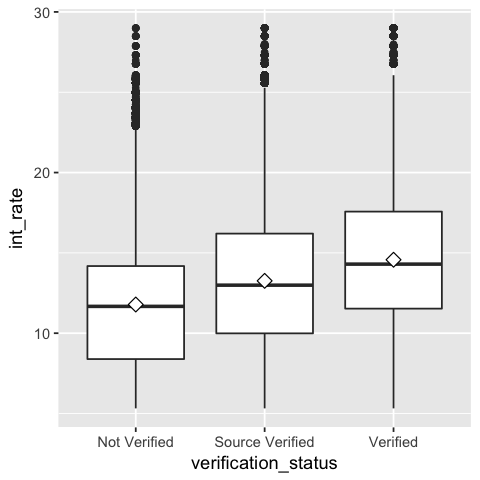

In [47]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(loan, aes(x=factor(verification_status), y=int_rate)) + 
geom_boxplot() + labs(x='verification_status') + 
stat_summary(fun.y="mean", geom="point", shape=23, size=3, fill="white")

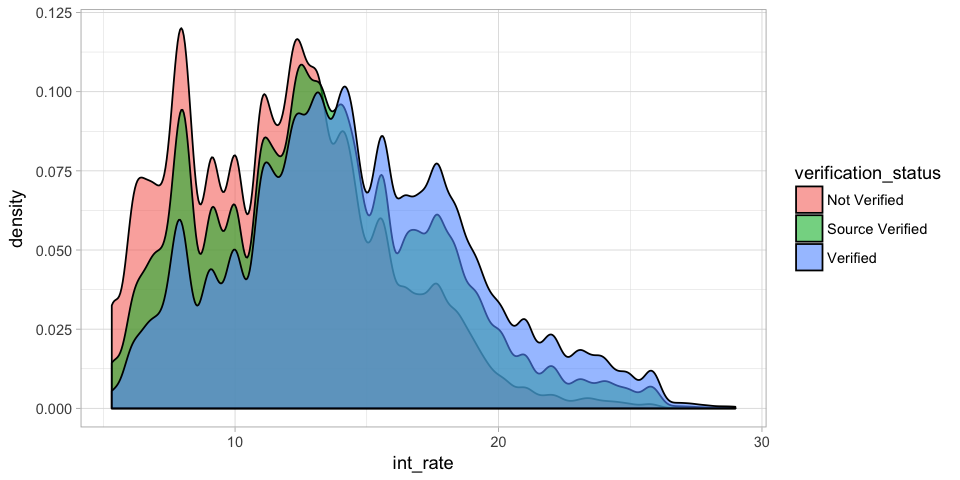

In [48]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x=int_rate, y= ..density.., fill=verification_status)) + 
theme_light() + 
geom_density(bw = 0.3, alpha= 0.6)

In [49]:
aov.res = aov(int_rate ~ factor(verification_status), na.action = na.omit, data = loan, )
summary(aov.res)

                                Df   Sum Sq Mean Sq F value Pr(>F)    
factor(verification_status)      2  1080177  540089   30032 <2e-16 ***
Residuals                   887376 15958157      18                   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

As the p-value is less than the significance level 0.001, we can conclude that there are significant differences between the different verification status. 

### 12. dti with int_rate
dti : A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

In [50]:
quantile(loan$dti)


0%     25%     50%     75%    100% 
   0.00   11.91   17.65   23.95 9999.00

In [51]:
# weak linear relationship
cor(loan$dti, loan$int_rate)

[1] 0.07990255

### 13. dti_joint with int_rate
numerical: continuous
drop this feature

In [52]:
sum(is.na(loan$dti_joint))/dim(loan)[1]


[1] 0.9994264

### 14. inq_fi with int_rate
inq_fi : Number of personal finance inquiries

In [53]:
# drop this feature
sum(is.na(loan$inq_fi))/dim(loan)[1]

[1] 0.9759156

### 15. inq_last_12m with int_rate
inq_last_12m : Number of credit inquiries in past 12 months

In [54]:
# drop this feature
sum(is.na(loan$inq_last_12m))/dim(loan)[1]

[1] 0.9759156

### 16. inq_last_6mths with int_rate
inq_last_6mths : The number of inquiries in past 6 months (excluding auto and mortgage inquiries)

In [55]:
sum(is.na(loan$inq_last_6mths))/dim(loan)[1]

[1] 3.268051e-05

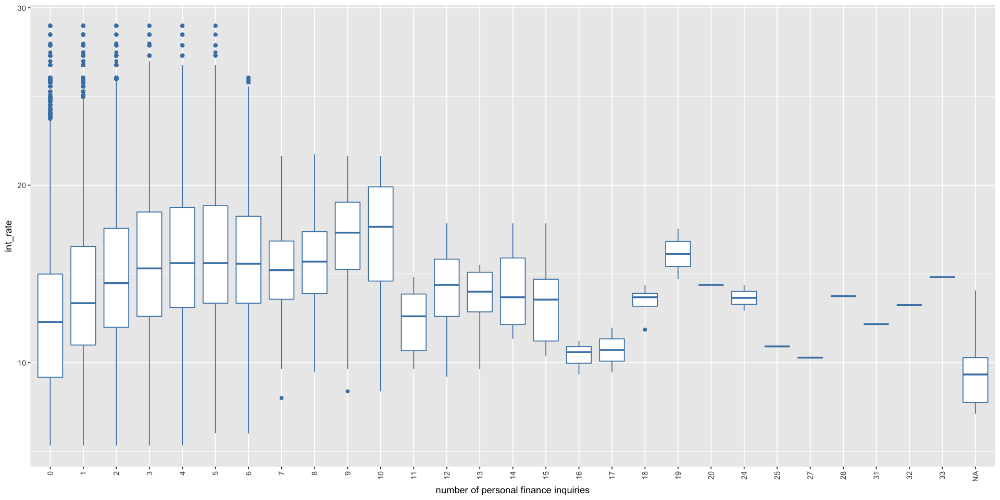

In [56]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(loan, aes(x=factor(inq_last_6mths), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='number of personal finance inquiries') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

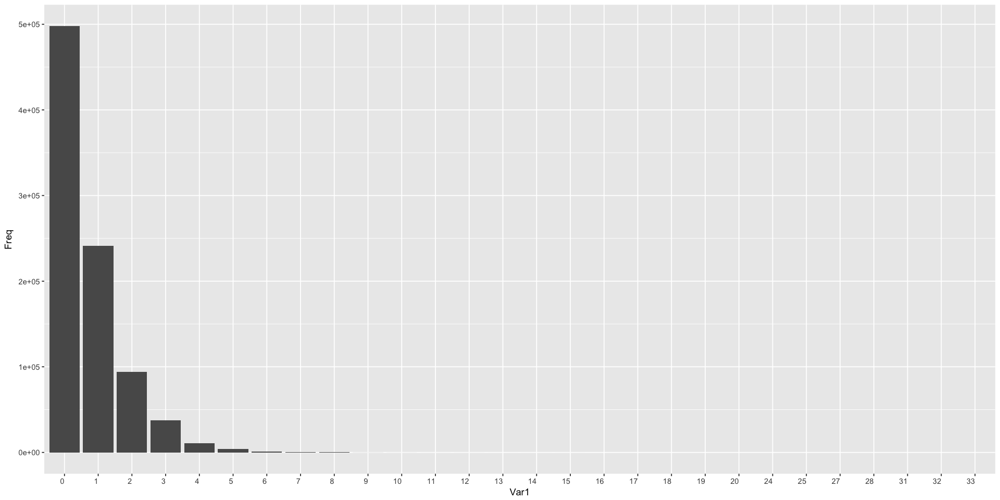

In [57]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(as.data.frame(table(loan$inq_last_6mths)), aes(x=Var1, y=Freq)) + 
geom_bar(stat="identity") + 
theme(axis.text.x = element_text(angle=0, hjust=1, vjust=.5),
        legend.position = "none")

In [58]:
# binning: > 4 is 5
loan$gen_inq_last_6mths = loan$inq_last_6mths
loan$gen_inq_last_6mths[loan$inq_last_6mths > 4] = 5

### 17. last_credit_pull_d with int_rate
last_credit_pull_d : The most recent month LC pulled credit for this loan

In [59]:
sum(is.na(loan$last_credit_pull_d_date))/dim(loan)[1]

[1] 5.972645e-05

In [60]:
library("zoo")
loan$last_credit_pull_d_date = as.Date(as.yearmon(loan$last_credit_pull_d, "%b-%Y"))

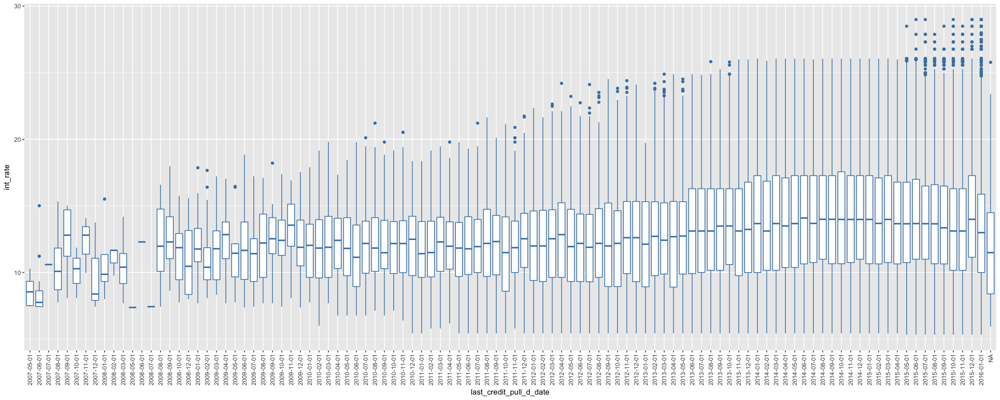

In [61]:
options(repr.plot.width=20, repr.plot.height=8)
ggplot(loan, aes(x=factor(last_credit_pull_d_date), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='last_credit_pull_d_date') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

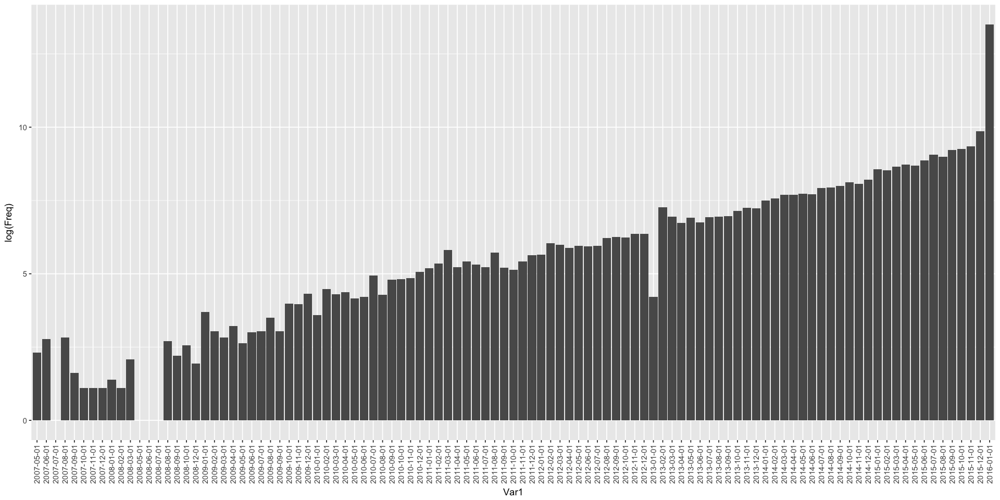

In [62]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(as.data.frame(table(loan$last_credit_pull_d_date)), aes(x=Var1, y=log(Freq))) + 
geom_bar(stat="identity") + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

### 18. total_acc with int_rate
total_acc : The total number of credit lines currently in the borrower's credit file

In [63]:
sum(is.na(loan$total_acc))/dim(loan)[1]


[1] 3.268051e-05

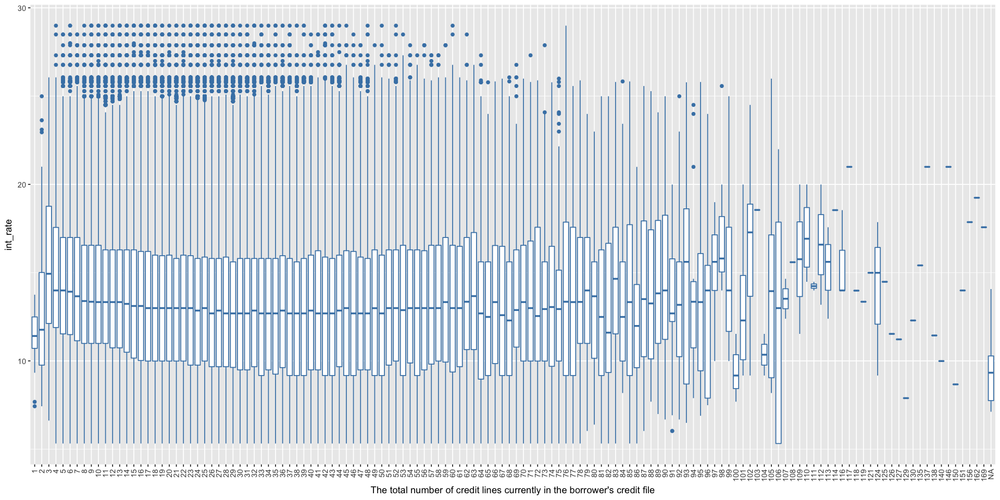

In [64]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(loan, aes(x=factor(total_acc), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x="The total number of credit lines currently in the borrower's credit file") + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

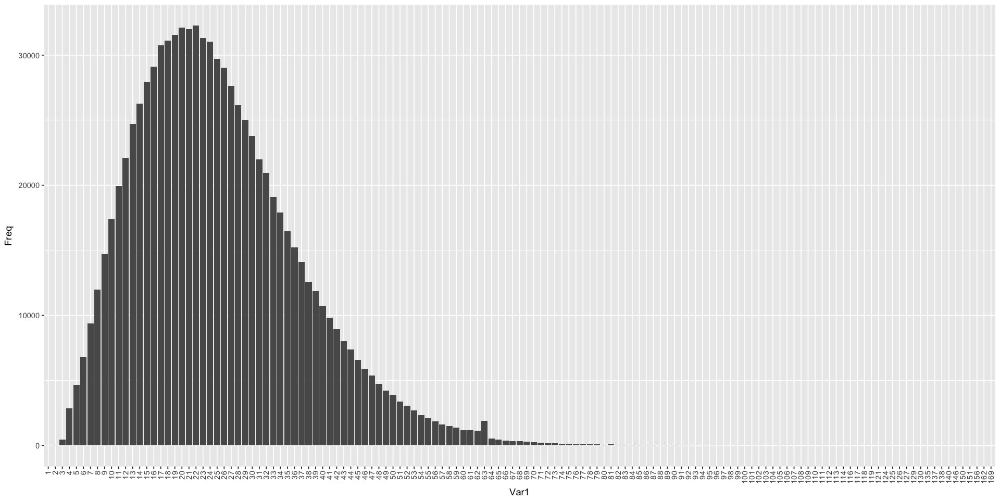

In [65]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(as.data.frame(table(loan$total_acc)), aes(x=Var1, y=Freq)) + 
geom_bar(stat="identity") + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

could be modeled as log normal


### 19. tot_cur_bal with int_rate¶
tot_cur_bal : Total current balance of all accounts

In [66]:
sum(is.na(loan$tot_cur_bal))/dim(loan)[1]

[1] 0.07919502

Warning message:
“Removed 70276 rows containing non-finite values (stat_binhex).”Warning message:
“Removed 70276 rows containing non-finite values (stat_smooth).”

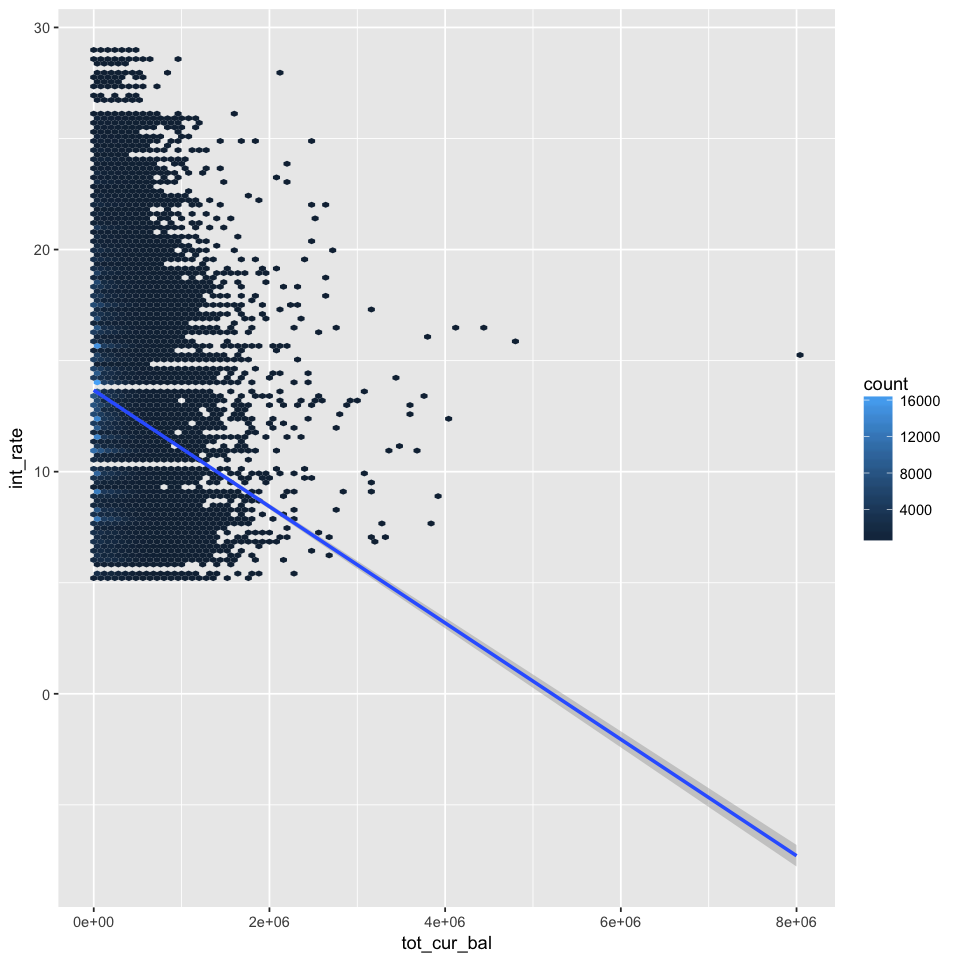

In [67]:
# linear relationship
options(repr.plot.width=8, repr.plot.height=8)
ggplot(loan, aes(x = tot_cur_bal, y=int_rate)) + geom_hex(bins=100) + stat_smooth(method=lm)

Warning message:
“Removed 70402 rows containing non-finite values (stat_binhex).”Warning message:
“Removed 70402 rows containing non-finite values (stat_smooth).”

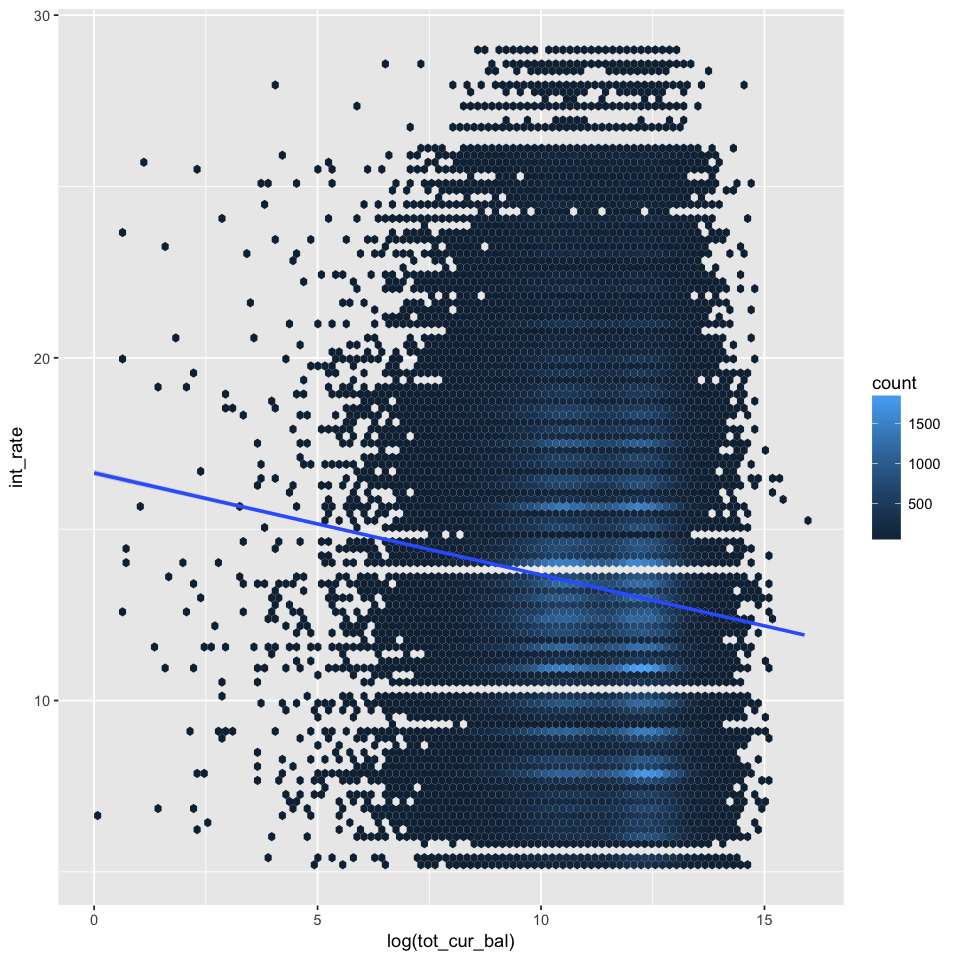

In [68]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(loan, aes(x = log(tot_cur_bal), y=int_rate)) + geom_hex(bins=100) + stat_smooth(method=lm)

In [69]:
# new feature
loan$gen_log_tot_cur_bal = log(loan$tot_cur_bal)

### 20. all_util with int_rate
all_util : Balance to credit limit on all trades

In [70]:
# drop this feature
sum(is.na(loan$all_util))/dim(loan)[1]

[1] 0.9759156

### 21. open_acc with int_rate
open_acc : The number of open credit lines in the borrower's credit file.

[1] 3.268051e-05

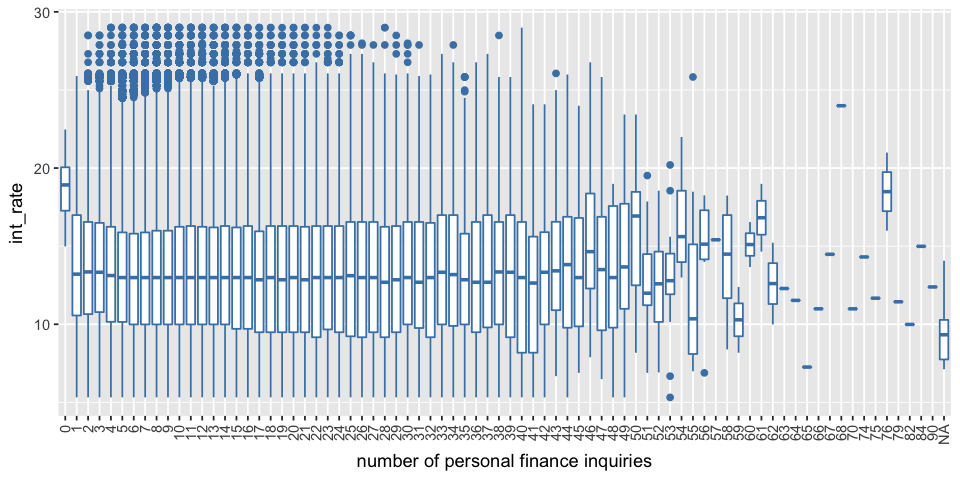

In [71]:
sum(is.na(loan$open_acc))/dim(loan)[1]

options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x=factor(open_acc), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='number of personal finance inquiries') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

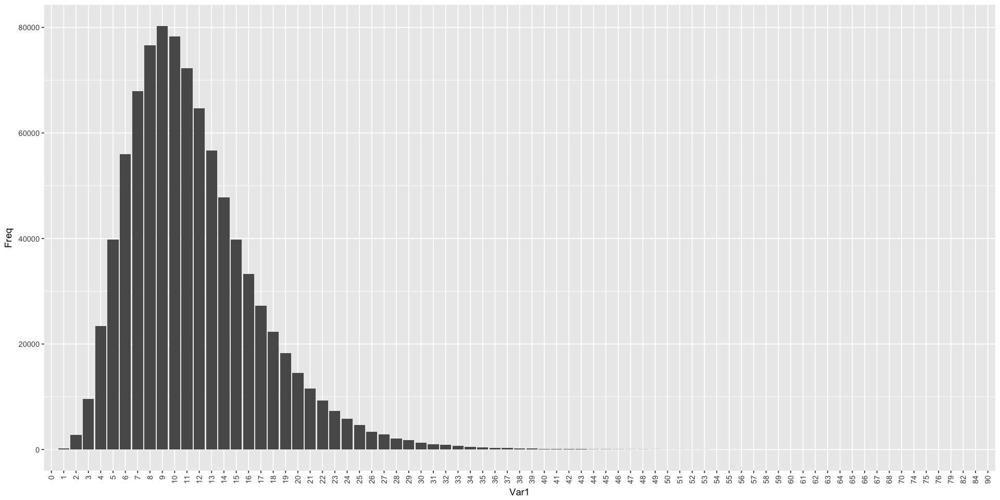

In [72]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(as.data.frame(table(loan$open_acc)), aes(x=Var1, y=Freq)) + 
geom_bar(stat="identity") + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

### 22. open_acc_6m with int_rate
open_acc_6m : Number of open trades in last 6 months

In [73]:
# drop feature
sum(is.na(loan$open_acc_6m))/dim(loan)[1]

[1] 0.9759156

### 23. total_cu_tl with int_rate
total_cu_tl : Number of finance trades

In [74]:
# drop feature
sum(is.na(loan$total_cu_tl))/dim(loan)[1]

[1] 0.9759156

### 24. acc_now_delinq with int_rate
acc_now_deling : The number of accounts on which the borrower is now delinquent.

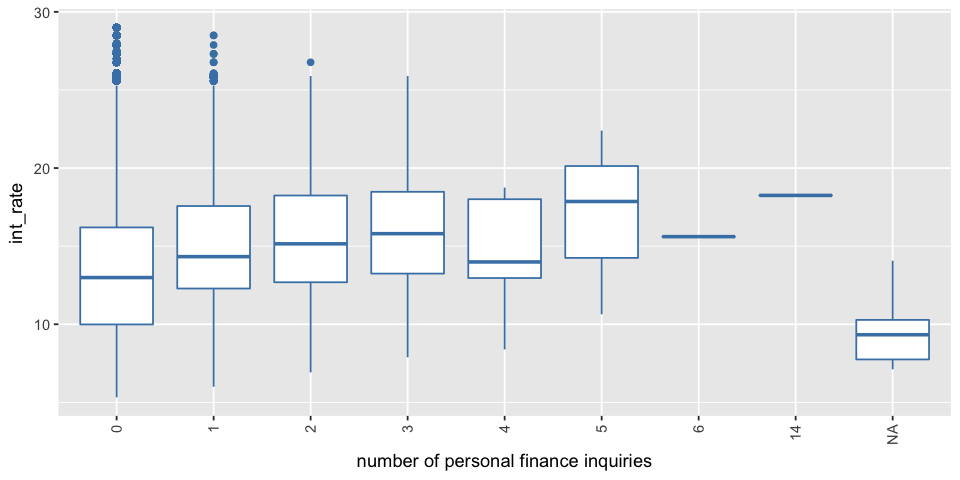

In [75]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x=factor(acc_now_delinq), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='number of personal finance inquiries') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

In [76]:
aov.res = aov(int_rate ~ factor(acc_now_delinq), na.action = na.omit, data = loan, )
summary(aov.res)

                           Df   Sum Sq Mean Sq F value Pr(>F)    
factor(acc_now_delinq)      7    12725  1817.9   94.75 <2e-16 ***
Residuals              887342 17025096    19.2                   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1
29 observations deleted due to missingness

As the p-value is less than the significance level 0.001, we can conclude that there are significant differences between the different verification status. 

### 25. delinq_2yrs with int_rate
delinq_2yrs : The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years

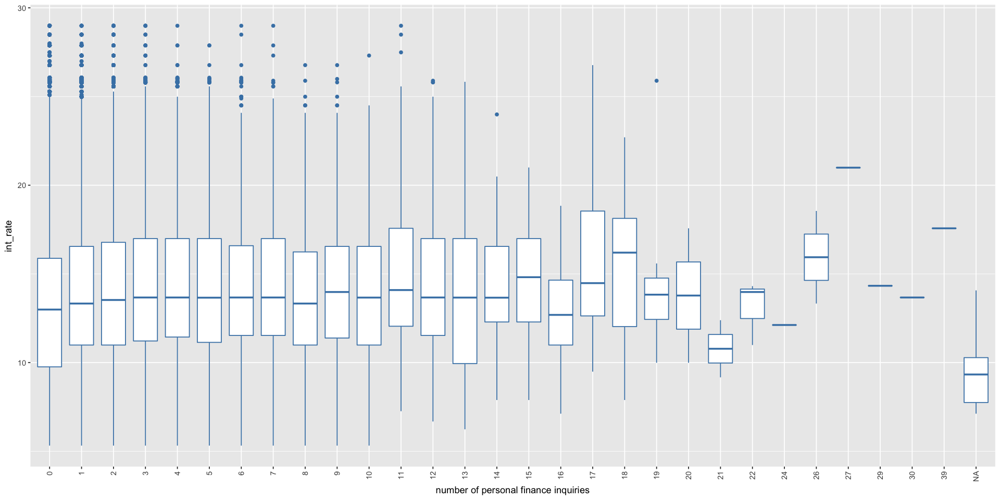

In [77]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(loan, aes(x=factor(delinq_2yrs), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='number of personal finance inquiries') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

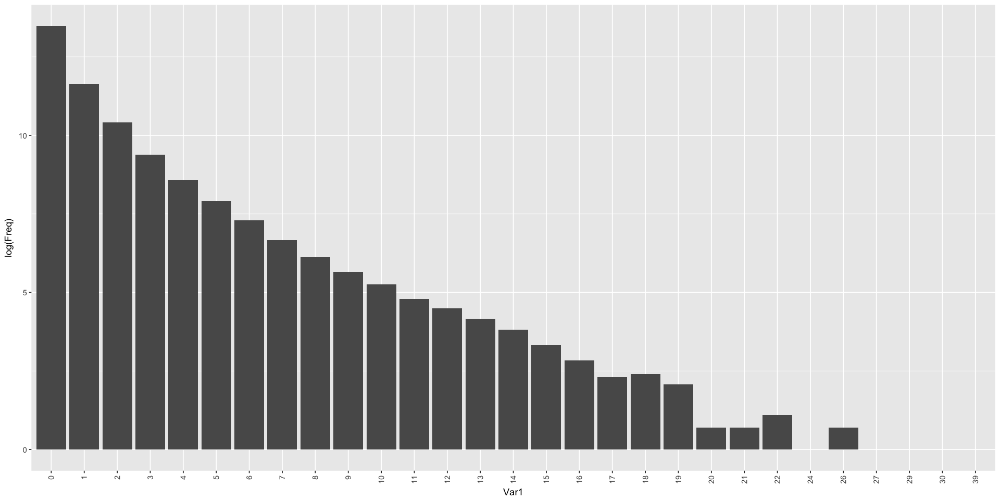

In [78]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(as.data.frame(table(loan$delinq_2yrs)), aes(x=Var1, y=log(Freq))) + 
geom_bar(stat="identity") + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

Warning message:
“Removed 29 rows containing non-finite values (stat_binhex).”Warning message:
“Removed 29 rows containing non-finite values (stat_smooth).”

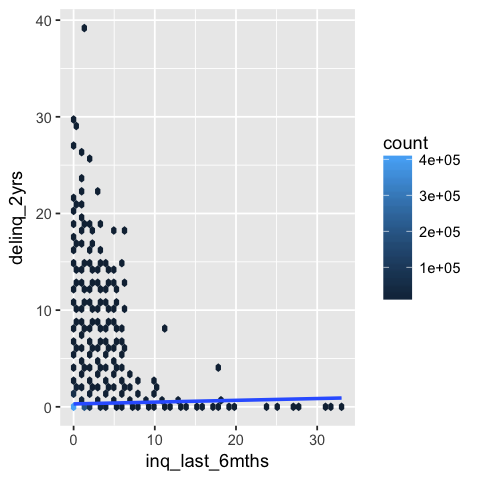

In [79]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(loan, aes(x = inq_last_6mths, y=delinq_2yrs)) + geom_hex(bins=50) + stat_smooth(method=lm)

### 26. mths_since_last_delinq
mths_since_last_delinq : The number of months since the borrower's last delinquency.

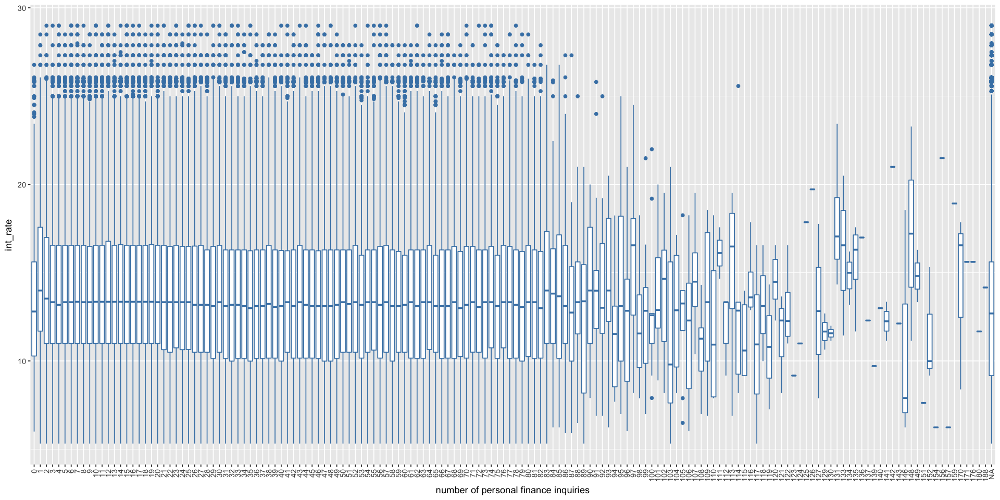

In [80]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(loan, aes(x=factor(mths_since_last_delinq), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='number of personal finance inquiries') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

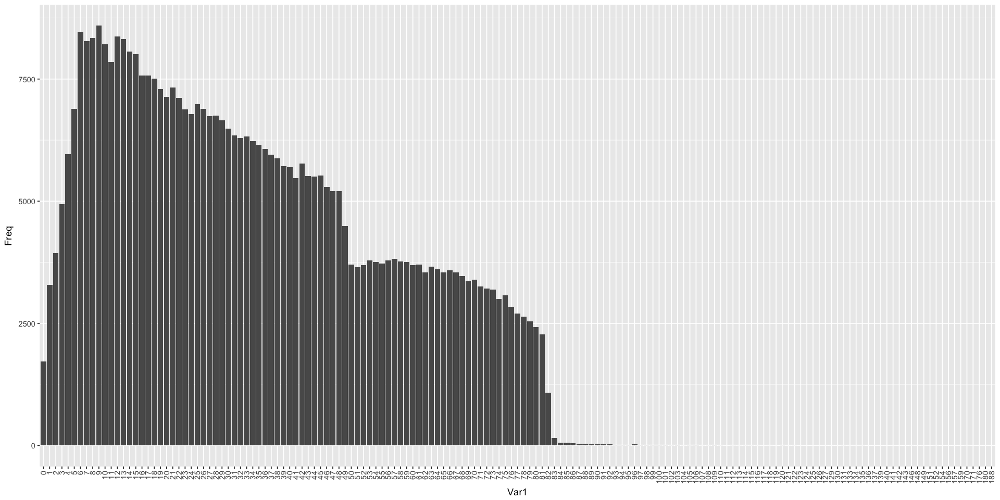

In [81]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(as.data.frame(table(loan$mths_since_last_delinq)), aes(x=Var1, y=Freq)) + 
geom_bar(stat="identity") + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

### 27. collections_12_mths_ex_med
collections_12_mths_ex_med : Number of collections in 12 months excluding medical collections

In [82]:
table(loan$collections_12_mths_ex_med)



     0      1      2      3      4      5      6      7     10     14     16 
875553  10824    732     88     23      7      2      1      1      1      1 
    20 
     1 

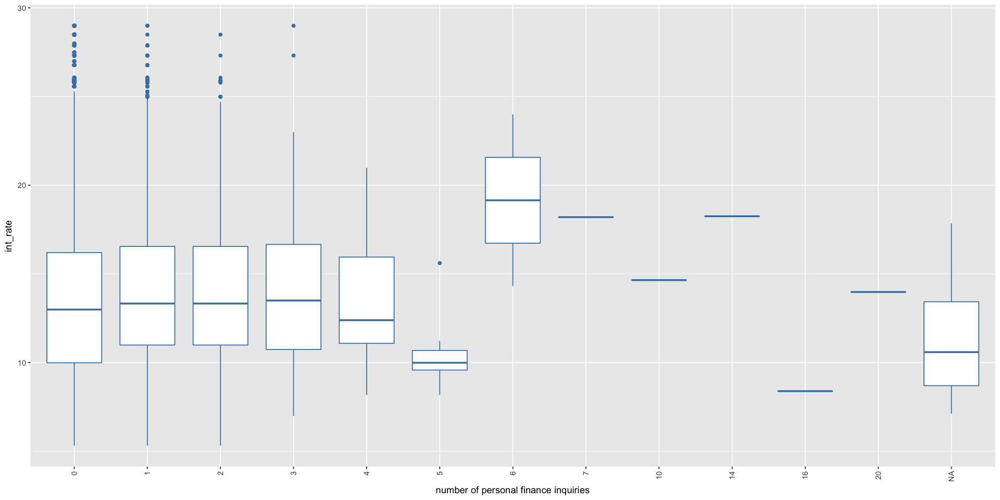

In [83]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(loan, aes(x=factor(collections_12_mths_ex_med), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='number of personal finance inquiries') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

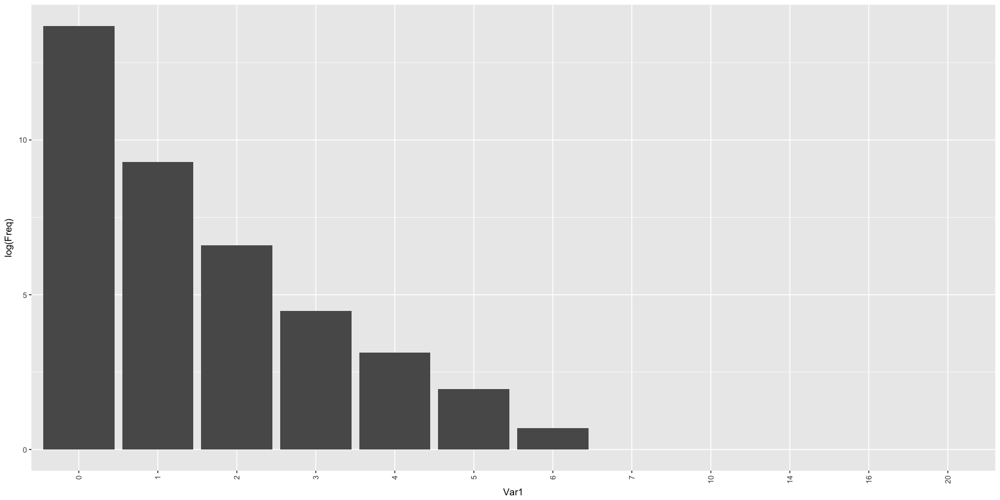

In [84]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(as.data.frame(table(loan$collections_12_mths_ex_med)), aes(x=Var1, y=log(Freq))) + 
geom_bar(stat="identity") + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")


### 28. tot_coll_amt
tot_coll_amt : Total collection amounts ever owed

Warning message:
“Removed 70276 rows containing non-finite values (stat_binhex).”

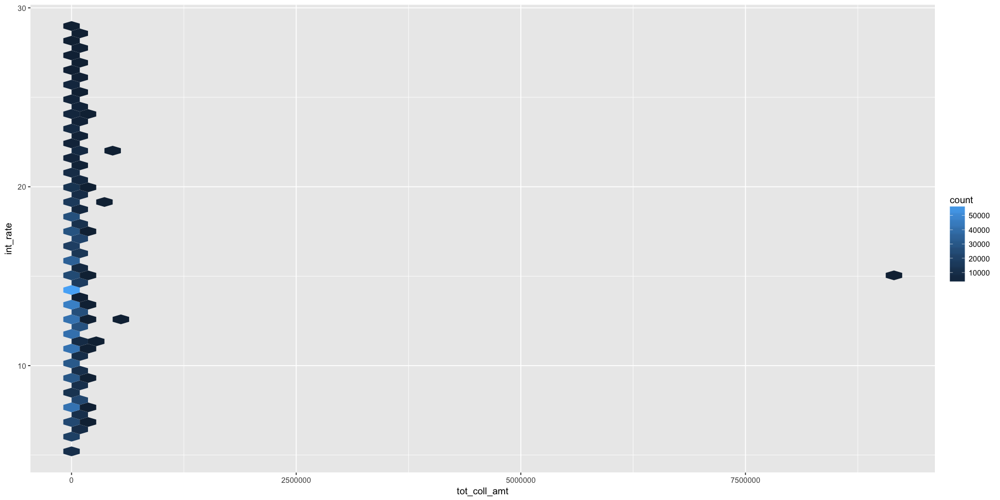

In [85]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(loan, aes(x=tot_coll_amt, y=int_rate)) + geom_hex(bins=50)


In [86]:
# generate feature log tot_coll_amt
loan$gen_log_tot_coll_amt = log(loan$tot_coll_amt)

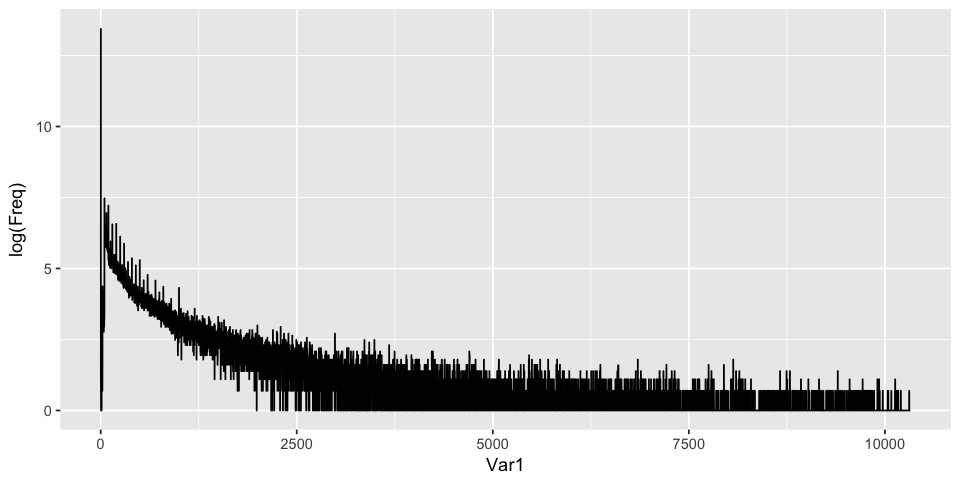

In [87]:
options(repr.plot.width=8, repr.plot.height=4)
tot_coll_amt.data = as.data.frame(table(loan$tot_coll_amt))
tot_coll_amt.data = as.data.frame(sapply(tot_coll_amt.data[, 1:2], as.numeric))
ggplot(tot_coll_amt.data, aes(x=Var1, y=log(Freq))) + 
geom_line()

### 29. pub_rec
pub_rec : Number of derogatory public records

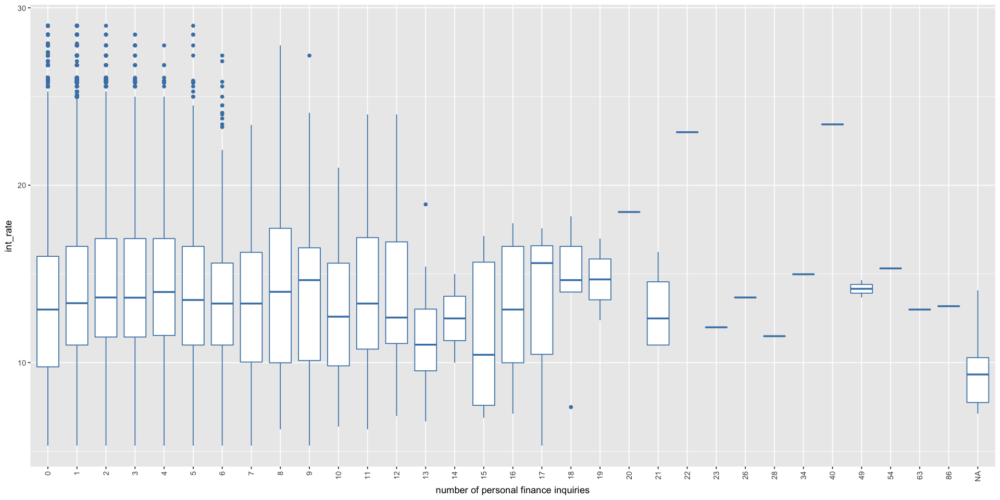

In [88]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(loan, aes(x=factor(pub_rec), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='number of personal finance inquiries') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")


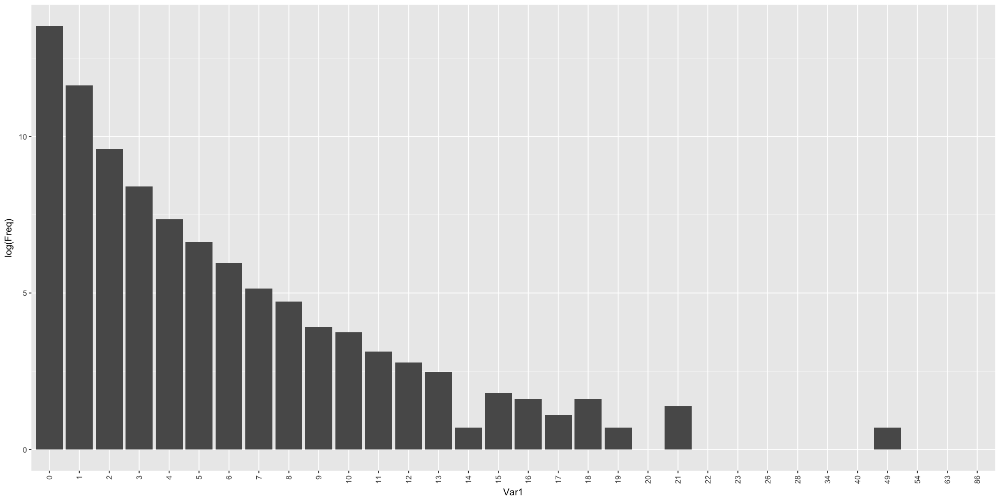

In [89]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(as.data.frame(table(loan$pub_rec)), aes(x=Var1, y=log(Freq))) + 
geom_bar(stat="identity") + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

### 30. mths_since_last_major_derog
mths_since_last_major_derog : Months since most recent 90-day or worse rating

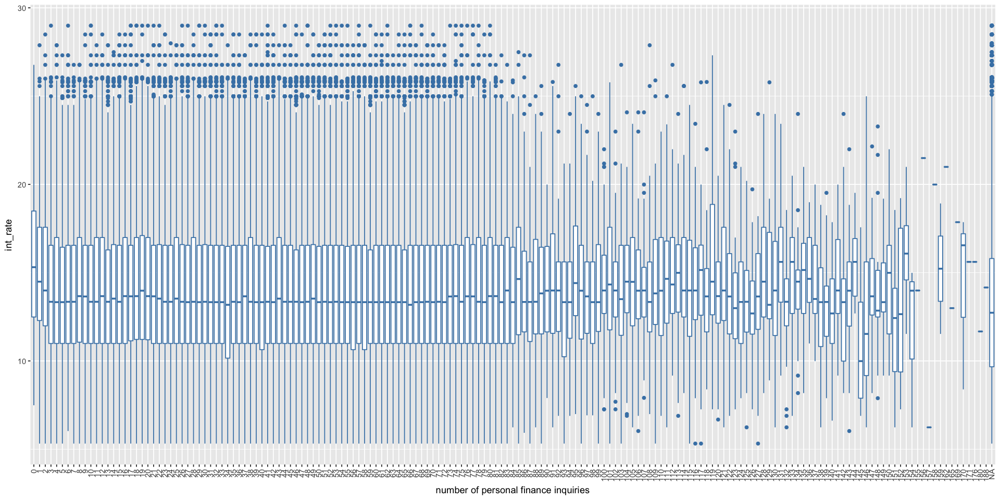

In [90]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(loan, aes(x=factor(mths_since_last_major_derog), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='number of personal finance inquiries') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

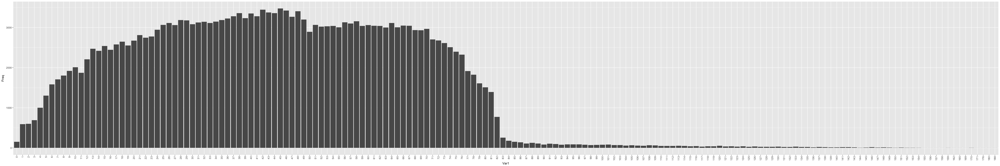

In [91]:
options(repr.plot.width=48, repr.plot.height=8)
ggplot(as.data.frame(table(loan$mths_since_last_major_derog)), aes(x=Var1, y=Freq)) + 
geom_bar(stat="identity") + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")


### 31. mths_since_last_record
mths_since_last_record : The number of months since the last public record.

In [92]:
# drop
sum(is.na(loan$mths_since_last_record))/dim(loan)[1]

[1] 0.845553

### 32. il_util
il_util : Ratio of total current balance to high credit/credit limit on all install acct

In [93]:
#drop
sum(is.na(loan$il_util))/dim(loan)[1]


[1] 0.9790202

### 33. mths_since_rcnt_il
mths_since_rcnt_il : Months since most recent installment accounts opened

In [94]:
# drop
sum(is.na(loan$mths_since_rcnt_il))/dim(loan)[1]

[1] 0.9765489

### 34. open_il_12m , 31. open_il_24m & open_il_6m¶
open_il_24m : Number of installment accounts opened in past 24 months

In [95]:
# drop
sum(is.na(loan$open_il_12m))/dim(loan)[1]
sum(is.na(loan$open_il_24m))/dim(loan)[1]
sum(is.na(loan$open_il_6m))/dim(loan)[1]

[1] 0.9759156

[1] 0.9759156

[1] 0.9759156

### 35. total_bal_il, max_bal_bc,open_rv_12m &  open_rv_24m
    total_bal_il : Total current balance of all installment accounts
    max_bal_bc : Maximum current balance owed on all revolving accounts
    open_rv_12m : Number of revolving trades opened in past 12 months
    open_rv_24m : Number of revolving trades opened in past 24 months

In [96]:
# drop
sum(is.na(loan$total_bal_il))/dim(loan)[1]
sum(is.na(loan$max_bal_bc))/dim(loan)[1]
sum(is.na(loan$open_rv_12m))/dim(loan)[1]
sum(is.na(loan$open_rv_24m))/dim(loan)[1]


[1] 0.9759156

[1] 0.9759156

[1] 0.9759156

[1] 0.9759156

### 36. revol_bal
revol_bal : Total credit revolving balance

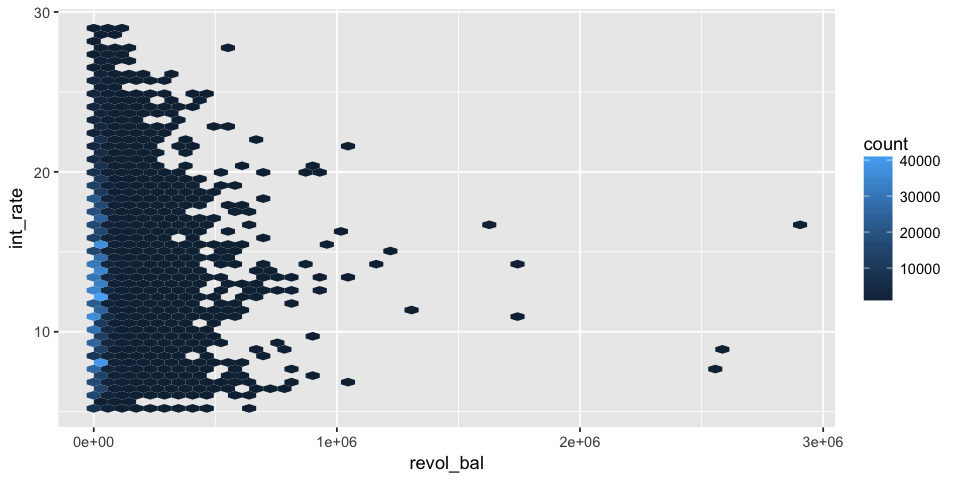

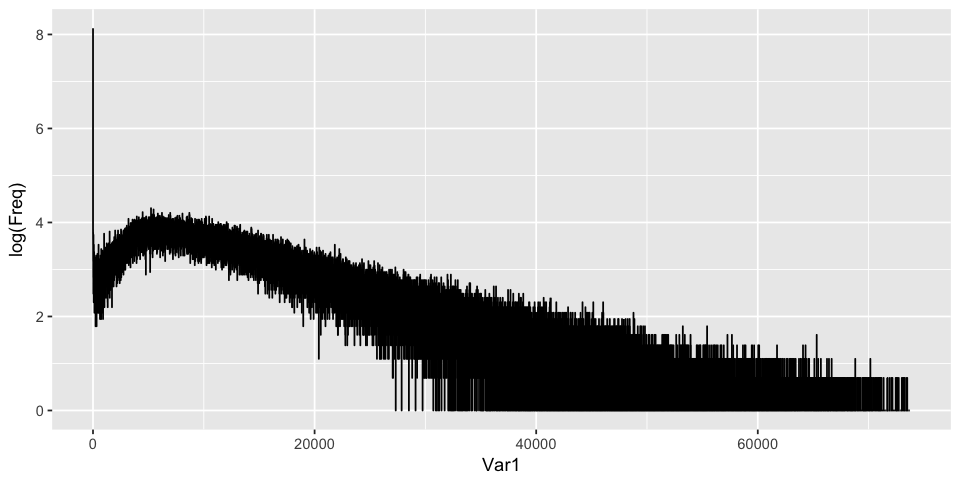

In [97]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x=revol_bal, y=int_rate)) + geom_hex(bins=50)

options(repr.plot.width=8, repr.plot.height=4)
revol_bal.data = as.data.frame(table(loan$revol_bal))
revol_bal.data = as.data.frame(sapply(revol_bal.data[, 1:2], as.numeric))
ggplot(revol_bal.data, aes(x=Var1, y=log(Freq))) + 
geom_line()

### 37. revol_util
revol_util : Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.

Warning message:
“Removed 502 rows containing non-finite values (stat_binhex).”

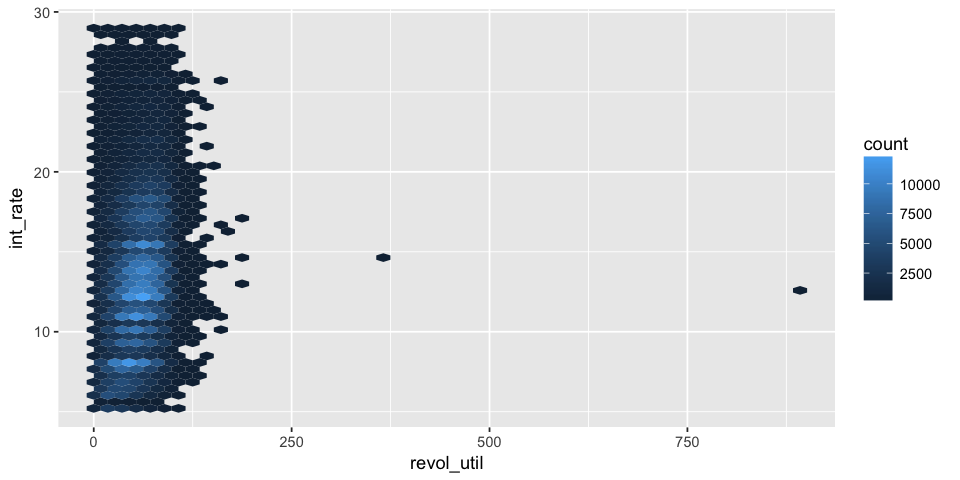

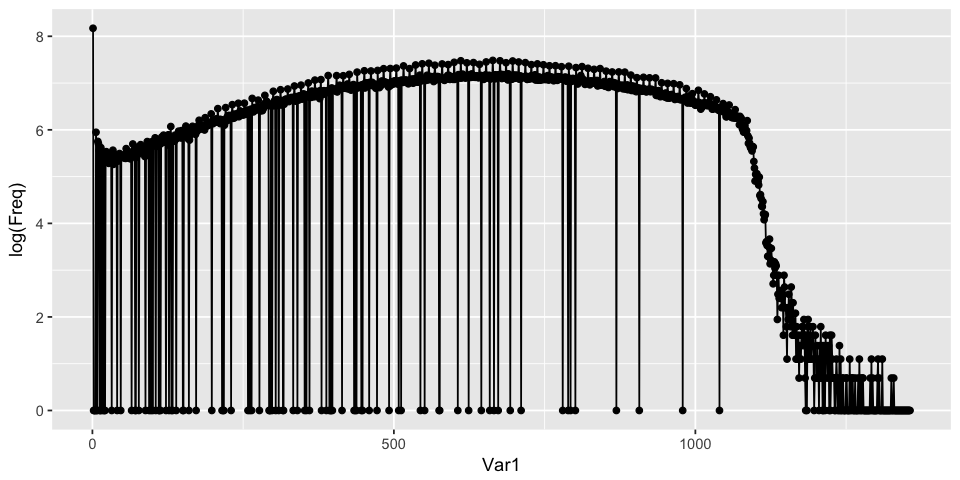

In [98]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x=revol_util, y=int_rate)) + geom_hex(bins=50)

revol_util.data = as.data.frame(table(loan$revol_util))
revol_util.data = as.data.frame(sapply(revol_util.data[, 1:2], as.numeric))
ggplot(revol_util.data, aes(x=Var1, y=log(Freq))) + 
geom_line() + geom_point()

### 38. total_rev_hi_lim  
total_rev_hi_lim : Total revolving high credit/credit limit

Warning message:
“Removed 70276 rows containing non-finite values (stat_binhex).”

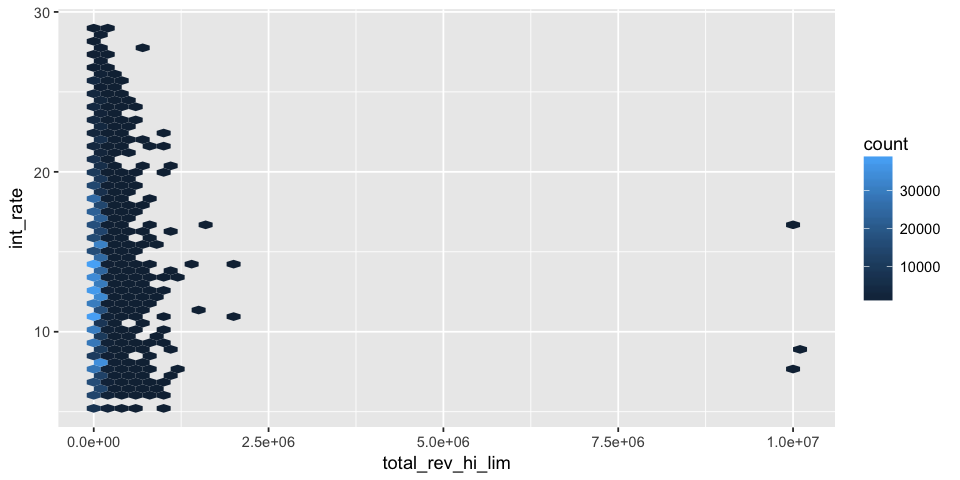

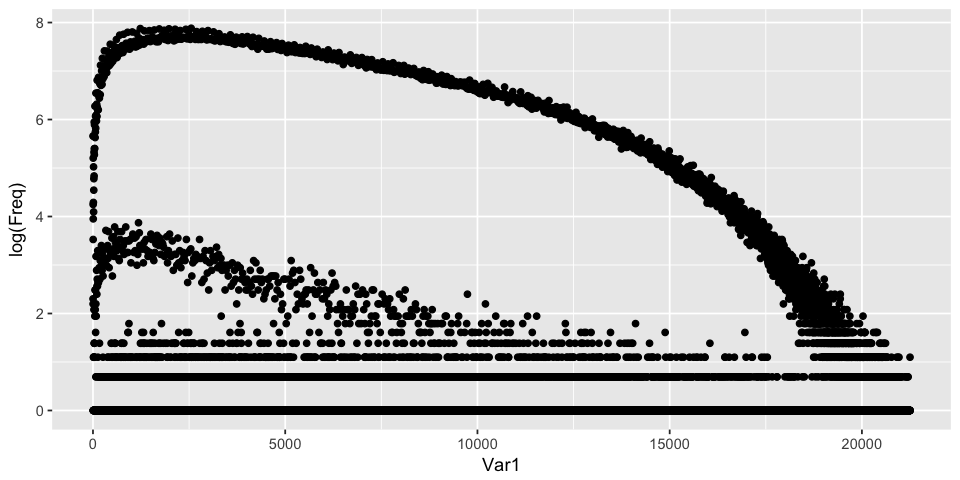

In [99]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x= total_rev_hi_lim, y=int_rate)) + geom_hex(bins=50)

options(repr.plot.width=8, repr.plot.height=4)
total_rev_hi_lim.data = as.data.frame(table(loan$total_rev_hi_lim))
total_rev_hi_lim.data = as.data.frame(sapply(total_rev_hi_lim.data[, 1:2], as.numeric))
ggplot(total_rev_hi_lim.data, aes(x=Var1, y=log(Freq))) + 
geom_point()


In [100]:
# New feature
loan$gen_log_total_rev_hi_lim = log(loan$total_rev_hi_lim)

### 39. policy_code
policy_code : publicly available policy_code=1
only one value, drop

In [101]:
# drop 
unique(loan$policy_code)

[1] 1

### 40. url
url : URL for the LC page with listing data.

In [102]:
# same as id, no use
loan$url[1:10]

[1] "https://www.lendingclub.com/browse/loanDetail.action?loan_id=1077501"
 [2] "https://www.lendingclub.com/browse/loanDetail.action?loan_id=1077430"
 [3] "https://www.lendingclub.com/browse/loanDetail.action?loan_id=1077175"
 [4] "https://www.lendingclub.com/browse/loanDetail.action?loan_id=1076863"
 [5] "https://www.lendingclub.com/browse/loanDetail.action?loan_id=1075358"
 [6] "https://www.lendingclub.com/browse/loanDetail.action?loan_id=1075269"
 [7] "https://www.lendingclub.com/browse/loanDetail.action?loan_id=1069639"
 [8] "https://www.lendingclub.com/browse/loanDetail.action?loan_id=1072053"
 [9] "https://www.lendingclub.com/browse/loanDetail.action?loan_id=1071795"
[10] "https://www.lendingclub.com/browse/loanDetail.action?loan_id=1071570"

### 41. application_type
application_type : Indicates whether the loan is an individual application or a joint application with two co-borrowers

In [103]:
table(loan$application_type)



INDIVIDUAL      JOINT 
    886868        511 

In [104]:
aov.res = aov(int_rate ~ factor(application_type), na.action = na.omit, data = loan, )
summary(aov.res)

                             Df   Sum Sq Mean Sq F value Pr(>F)    
factor(application_type)      1     1895  1894.7   98.69 <2e-16 ***
Residuals                887377 17036439    19.2                   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

In [105]:
# split data to individual & joint


### 42. desc
desc : Loan description provided by the borrower

In [106]:
# need nlp
loan$desc[1:10]

[1] "  Borrower added on 12/22/11 > I need to upgrade my business technologies.<br>"                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                
 [2] "  Borrower added on 12/22/11 > I plan to use this money to finance the motorcycle i am looking at. I plan to have it paid off as soon as possible/when i sell my old bike. I only need this money because the deal im looking at is to good to pass up.<br><br>  Borrower added on 12/22/11 > I plan to use this money to finance the motorcycle i am looking at. I plan to have it paid off as soon as possible/when i sell my old bike.I only need this money because the deal im looking at is to good to pass up. I have finished college with an associates degree in business and its takingmeplaces<br>"
 [3] ""                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              
 [4] "  Borrower added on 12/21/11 > to pay for property tax (borrow from friend, need to pay back) & central A/C need to be replace. I'm very sorry to let my loan expired last time.<br>"                                                                                                                                                                                                                                                                                                                                                                                                                          
 [5] "  Borrower added on 12/21/11 > I plan on combining three large interest bills together and freeing up some extra each month to pay toward other bills.  I've always been a good payor but have found myself needing to make adjustments to my budget due to a medical scare. My job is very stable, I love it.<br>"                                                                                                                                                                                                                                                                                            
 [6] ""                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              
 [7] "  Borrower added on 12/18/11 > I am planning on using the funds to pay off two retail credit cards with 24.99% interest rates, as well as a major bank credit card with a 18.99% rate.  I pay all my bills on time, looking for a lower combined payment and lower monthly payment.<br>"                                                                                                                               

### 43. id
id : A unique LC assigned ID for the loan listing.
no use

### 44. purpose
purpose : A category provided by the borrower for the loan request.

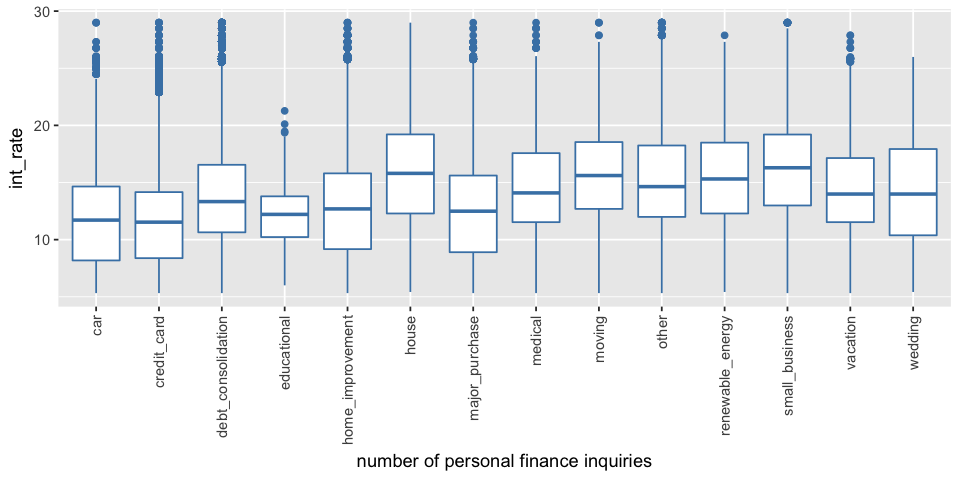

In [107]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x=factor(purpose), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='number of personal finance inquiries') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

In [108]:
aov.res = aov(int_rate ~ factor(purpose), na.action = na.omit, data = loan, )
summary(aov.res)

                    Df   Sum Sq Mean Sq F value Pr(>F)    
factor(purpose)     13   850015   65386    3584 <2e-16 ***
Residuals       887365 16188319      18                   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

### 45. title
title : The loan title provided by the borrower

In [109]:
loan$title = tolower(loan$title)            # convert all string to lowercase
unique(loan$title)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [110]:
unique(loan$title)[which(table(loan$title)>500)]

[1] "payoff the cards"                                          
 [2] "one debt group"                                            
 [3] "relief assistance"                                         
 [4] "paythatcreditcardoff!!!"                                   
 [5] "brad's loan"                                               
 [6] "consolidate and purchase engagement ring"                  
 [7] "john's personal loan"                                      
 [8] "home improvement - patio"                                  
 [9] "dale's loan"                                               
[10] "money 2010"                                                
[11] "small credit card debt consolidation"                      
[12] "quick pay off"                                             
[13] "my wife's education fund"                                  
[14] "help this reliable partner consolidate high interest debt!"
[15] "the backyard oasis"                                        
[16] "loan refinancing"                                          
[17] "remodel my kitchen"                                        
[18] "keeping credit score good"                                 
[19] "home theater completion"                                   
[20] "land investment"                                           
[21] "marlene"                                                   
[22] "bali and hong kong"                                        
[23] "expanding business (again)"                                
[24] "paying down some high rate credit cards"                   
[25] "lowerrate"                                                 
[26] "credit card debts consolidation"                           
[27] "credit card bye bye"                                       
[28] "consilation"                                               
[29] "happy day"                                                 
[30] "debt demolition"                                           
[31] "one loan to pay them all!"                                 
[32] "no more banks"                                             
[33] "get it done!"                                              
[34] "short and sweet"                                           
[35] "spring debt consolidation"                                 
[36] "debt free atlast"                                          
[37] " home improv "                                             
[38] "three years to get out of debt or die"                     
[39] "$$ thanks lending club $$"                                 
[40] "my first lending club loan"                                
[41] "thank goodness!"                                           
[42] "upgrade and remodeling"                                    
[43] "36 1000 loan"                                              
[44] "debt-free in three years"                                  
[45] "skim loan"

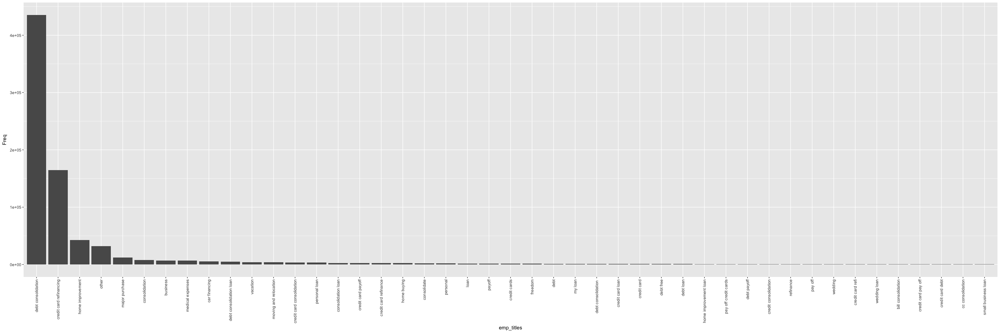

In [111]:
# bar plot 
title.pop = sort(table(loan$title)[which(table(loan$title)>500)], decreasing = T)
title.pop = as.data.frame(title.pop)

options(repr.plot.width=30, repr.plot.height=10)
ggplot(data = title.pop, aes(x=Var1, y=Freq)) + 
  geom_bar(stat="identity") + 
#    scale_y_log10() + 
    scale_x_discrete(name ="emp_titles", 
                     limits=title.pop$Var1)+
  theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

### 46. term
term : The number of payments on the loan. Values are in months and can be either 36 or 60.

In [112]:
unique(loan$term)

t.test(int_rate ~ term, data = loan, na.action = na.omit) # significant

[1] " 36 months" " 60 months"


	Welch Two Sample t-test

data:  int_rate by term
t = -431.12, df = 467040, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -4.111525 -4.074310
sample estimates:
mean in group  36 months mean in group  60 months 
                12.01868                 16.11160 


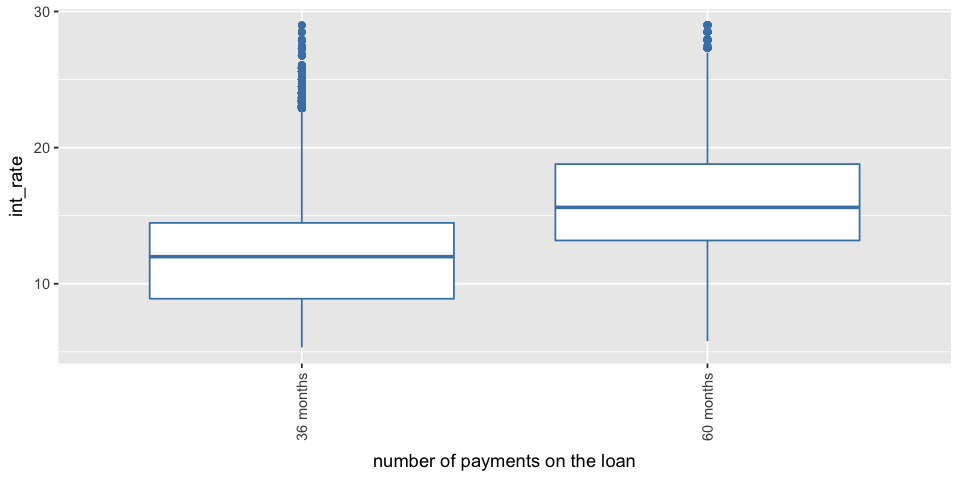

In [113]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x=factor(term), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='number of payments on the loan') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

### 47. issue_d
issue_d : The month which the loan was funded

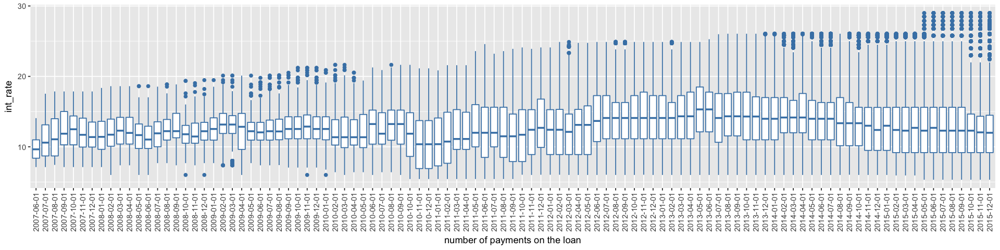

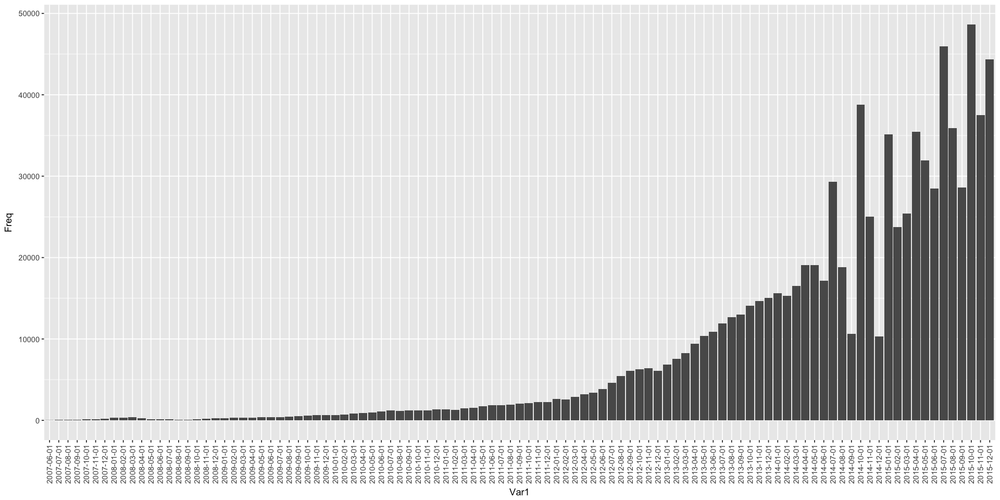

In [114]:
loan$issue_d_date = as.Date(as.yearmon(loan$issue_d, "%b-%Y"))

options(repr.plot.width=16, repr.plot.height=4)
ggplot(loan, aes(x=factor(issue_d_date), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='number of payments on the loan') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

options(repr.plot.width=16, repr.plot.height=8)
ggplot(as.data.frame(table(loan$issue_d_date)), aes(x=Var1, y=Freq)) + 
geom_bar(stat="identity") + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")


In [115]:
# generate feature issue_d, issue_year, issue_mon
loan$gen_issue_d <- as.Date(as.yearmon(loan$issue_d, "%b-%Y"))
loan$gen_issue_year <- as.character(format(loan$gen_issue_d, "%Y"))
loan$gen_issue_mon <- as.character(format(loan$gen_issue_d, "%m"))

### 48. initial_list_status
initial_list_status : The initial listing status of the loan. Possible values are – W, F

In [116]:
unique(loan$initial_list_status)

t.test(int_rate ~ initial_list_status, data = loan, na.action = na.omit) # significant

[1] "f" "w"


	Welch Two Sample t-test

data:  int_rate by initial_list_status
t = 109.03, df = 885520, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 0.9895826 1.0258105
sample estimates:
mean in group f mean in group w 
       13.73565        12.72795 


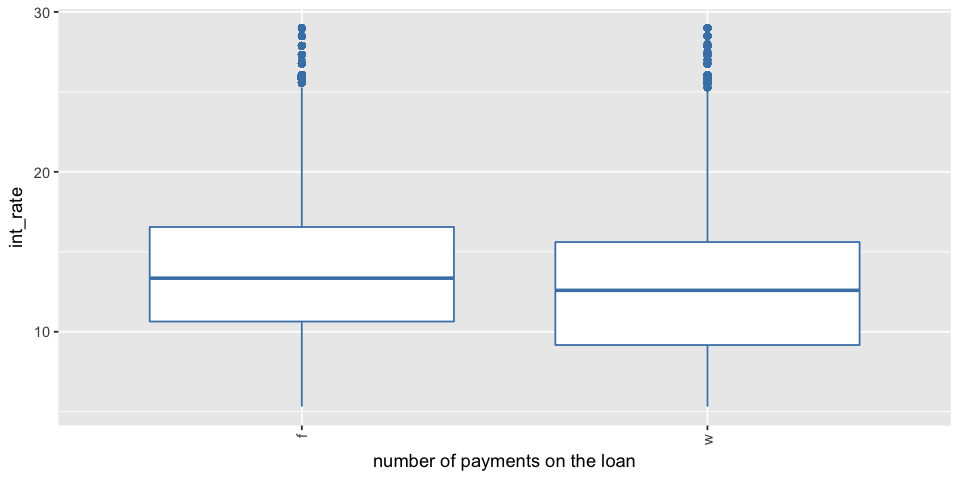

In [117]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x=factor(initial_list_status), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='number of payments on the loan') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

### 49. loan_amnt
loan_amnt : The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

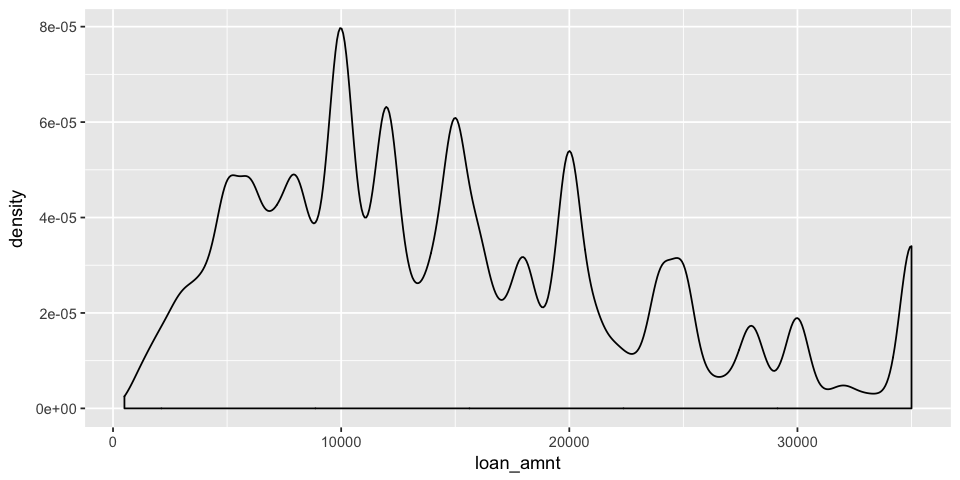

In [118]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x=loan_amnt, y= ..density..)) + 
geom_density()

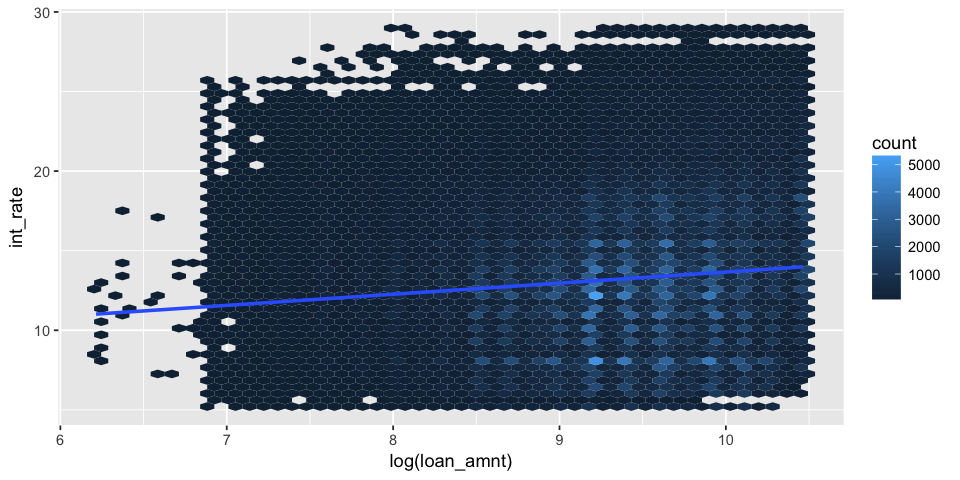

In [119]:
ggplot(loan, aes(x= log(loan_amnt), y=int_rate)) + geom_hex(bins=50) + stat_smooth(method=lm)

In [120]:
loan$gen_log_loan_amnt = log(loan$loan_amnt)

### 50. installment
installment : The monthly payment owed by the borrower if the loan originates.

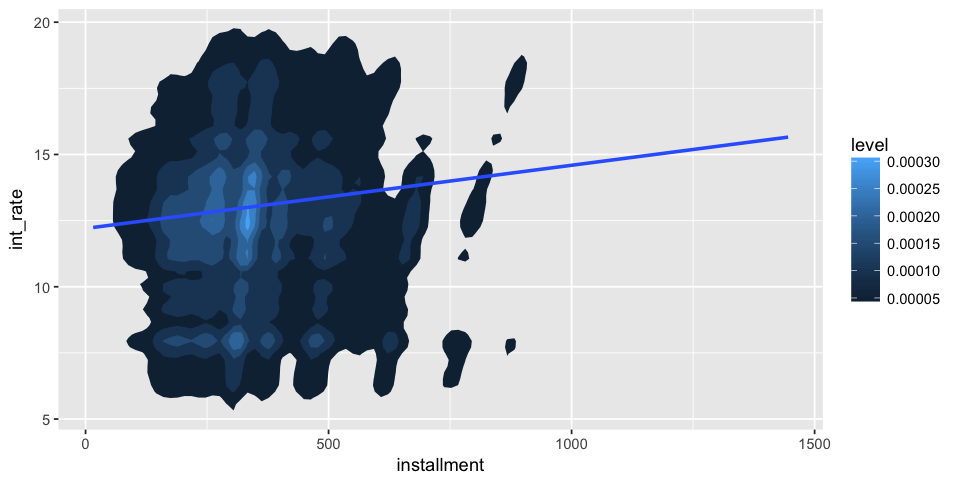

In [121]:
ggplot(loan, aes(x= installment, y=int_rate)) + 
stat_density_2d(aes(fill = ..level..), geom = "polygon") + 
stat_smooth(method=lm)

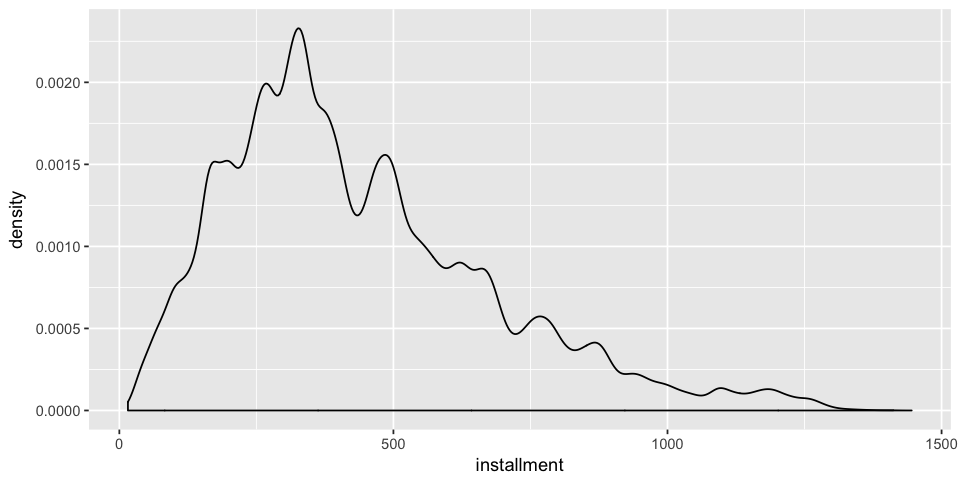

In [122]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x=installment, y= ..density..)) + 
geom_density()

### 51. funded_amnt
funded_amnt : The total amount committed to that loan at that point in time.

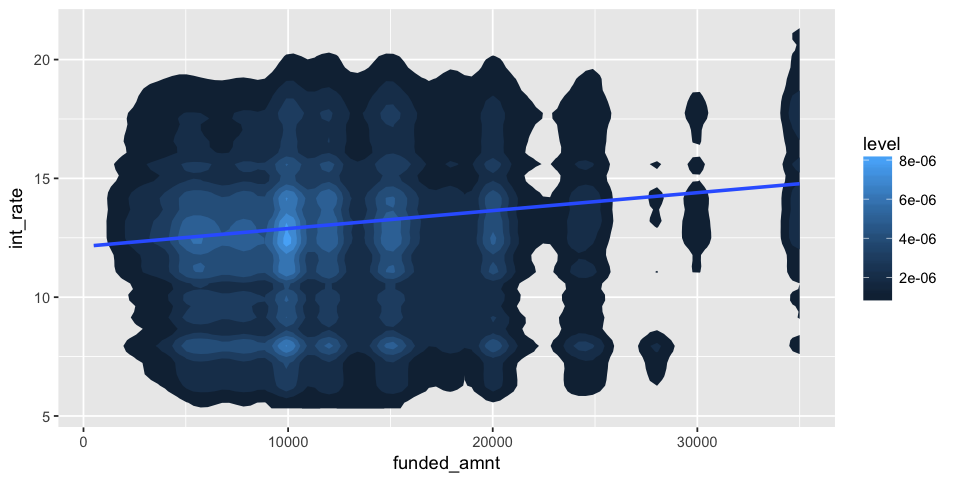

In [123]:
ggplot(loan, aes(x= funded_amnt, y=int_rate)) + 
stat_density_2d(aes(fill = ..level..), geom = "polygon") + 
stat_smooth(method=lm)

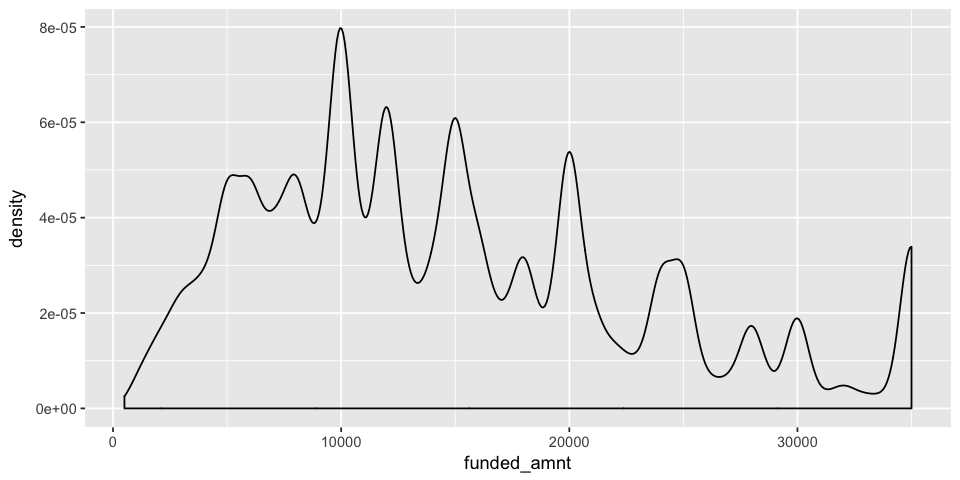

In [124]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(loan, aes(x=funded_amnt, y= ..density..)) + 
geom_density()

In [125]:
# only keep one is enough
cor(loan$funded_amnt, loan$funded_amnt_inv)

[1] 0.9980251

### 52. last_pymnt_amnt
last_pymnt_amnt : Last total payment amount received.

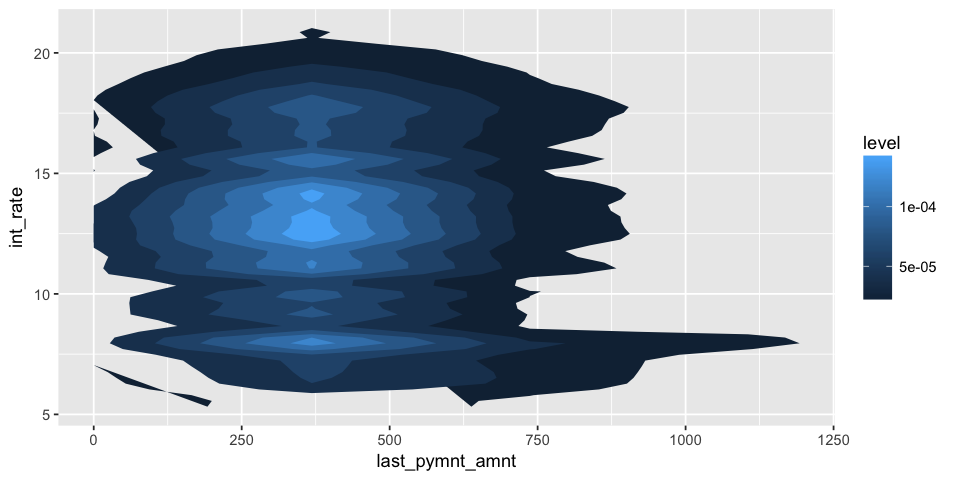

In [126]:
ggplot(loan, aes(x= last_pymnt_amnt, y=int_rate)) + 
stat_density_2d(aes(fill = ..level..), geom = "polygon") 
# stat_smooth(method=lm)

### 53. last_pymnt_d
last_pymnt_d : Last month payment was received

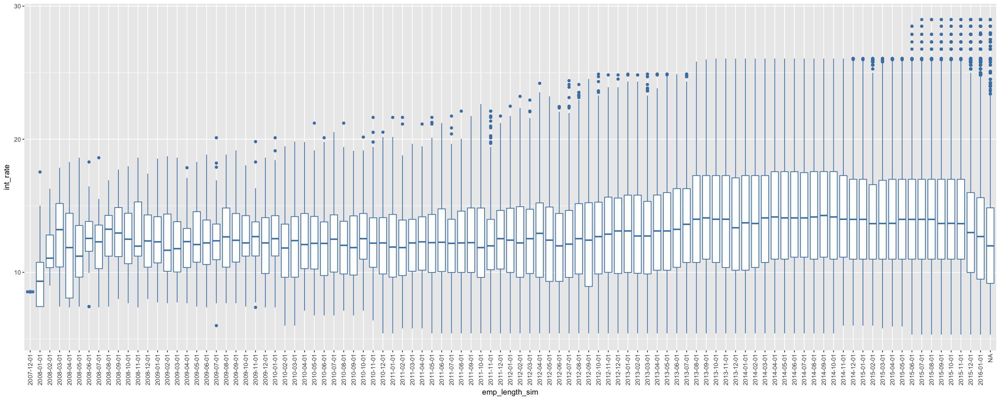

In [127]:
loan$last_pymnt_d_date = as.Date(as.yearmon(loan$last_pymnt_d, "%b-%Y"))

options(repr.plot.width=20, repr.plot.height=8)
ggplot(loan, aes(x=factor(last_pymnt_d_date), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='emp_length_sim') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

### 54. next_pymnt_d
next_pymnt_d : Next scheduled payment date

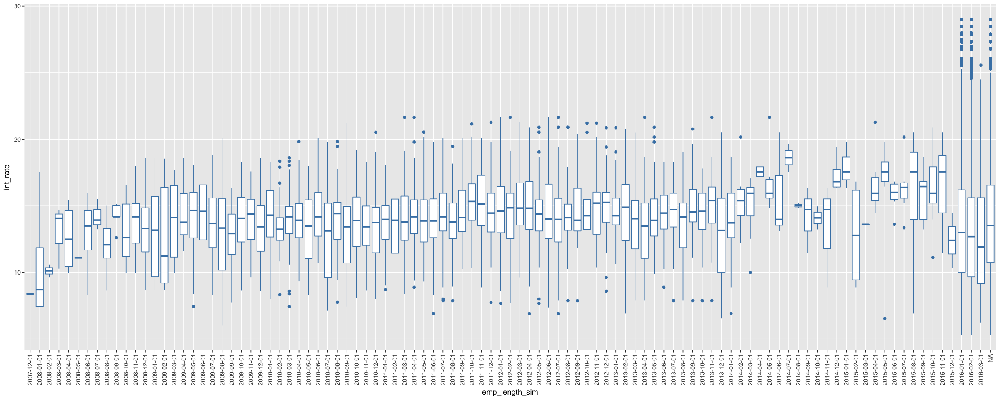

In [128]:
loan$next_pymnt_d_date = as.Date(as.yearmon(loan$next_pymnt_d, "%b-%Y"))
options(repr.plot.width=20, repr.plot.height=8)
ggplot(loan, aes(x=factor(next_pymnt_d_date), y=int_rate)) + 
geom_boxplot(color='steelblue') + labs(x='emp_length_sim') + 
theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none")

### 55. pymnt_plan
pymnt_plan : Indicates if a payment plan has been put in place for the loan

In [129]:
# basic no use
table(loan$pymnt_plan)


     n      y 
887369     10 

### 56. recoveries
recoveries : post charge off gross recovery

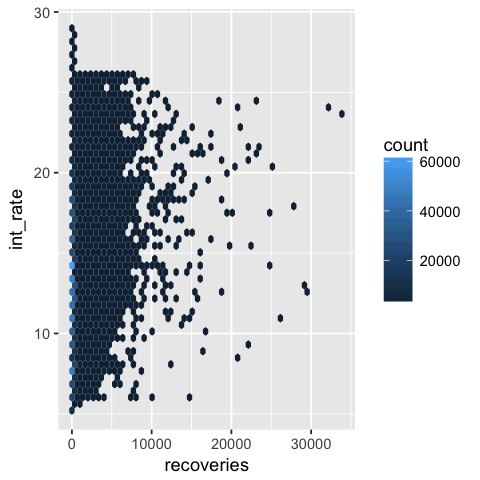

In [130]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(loan, aes(x=recoveries, y=int_rate)) + geom_hex(bins=50) #+ stat_smooth(method=lm)

### 57. total_pymnt
total_pymnt : Payments received to date for total amount funded

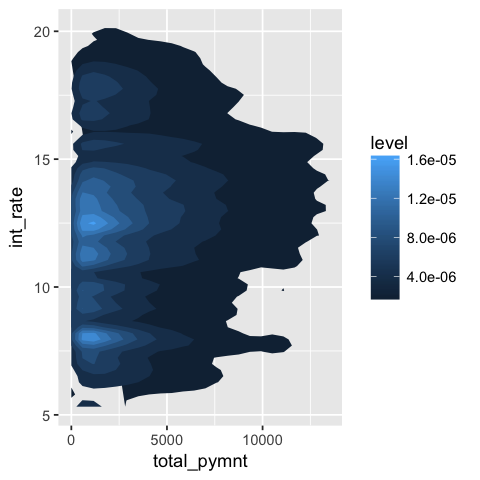

In [131]:
ggplot(loan, aes(x= total_pymnt, y=int_rate)) + 
stat_density_2d(aes(fill = ..level..), geom = "polygon")

In [132]:
# only keep one is enough
cor(loan$total_pymnt, loan$total_pymnt_inv)

[1] 0.9975923

### 58. total_rec_int
total_rec_int : Interest received to date

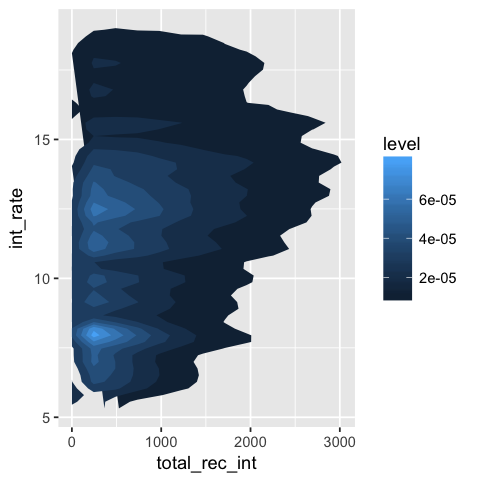

In [133]:
ggplot(loan, aes(x= total_rec_int, y=int_rate)) + 
stat_density_2d(aes(fill = ..level..), geom = "polygon")

### 59. total_rec_late_fee
total_rec_late_fee : Late fees received to date

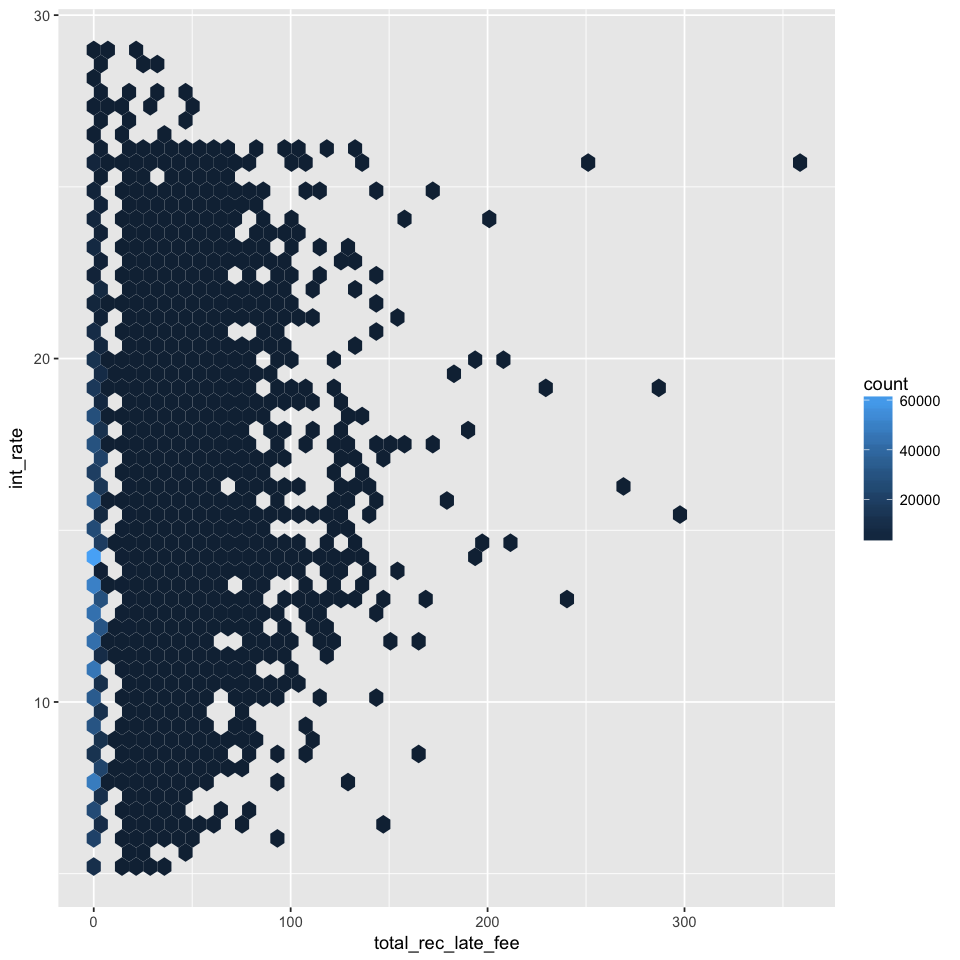

In [134]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(loan, aes(x=total_rec_late_fee, y=int_rate)) + geom_hex(bins=50) #+ stat_smooth(method=lm)

In [135]:
cor(loan$total_rec_late_fee, loan$int_rate)

[1] 0.05715012

### 60. total_rec_prncp
total_rec_prncp : Principal received to date

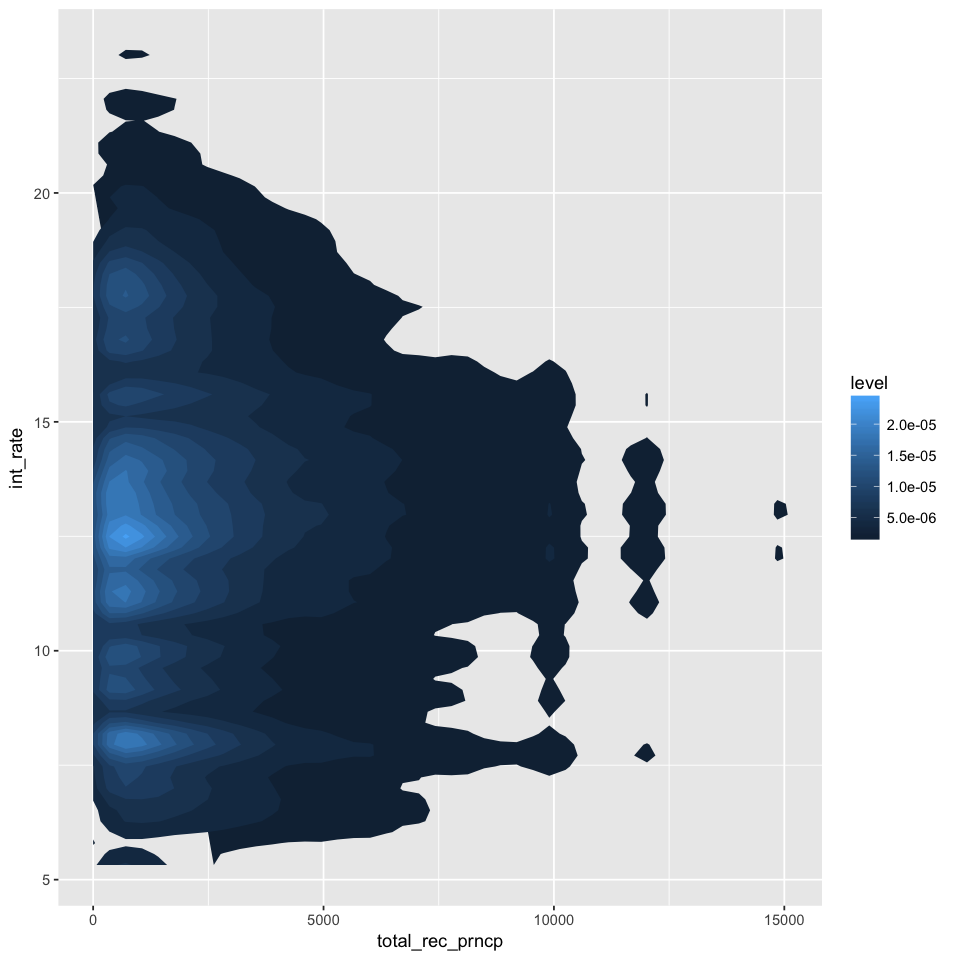

In [136]:
ggplot(loan, aes(x= total_rec_prncp, y=int_rate)) + 
stat_density_2d(aes(fill = ..level..), geom = "polygon")

### 61. collection_recovery_fee
collection_recovery_fee : post charge off collection fee

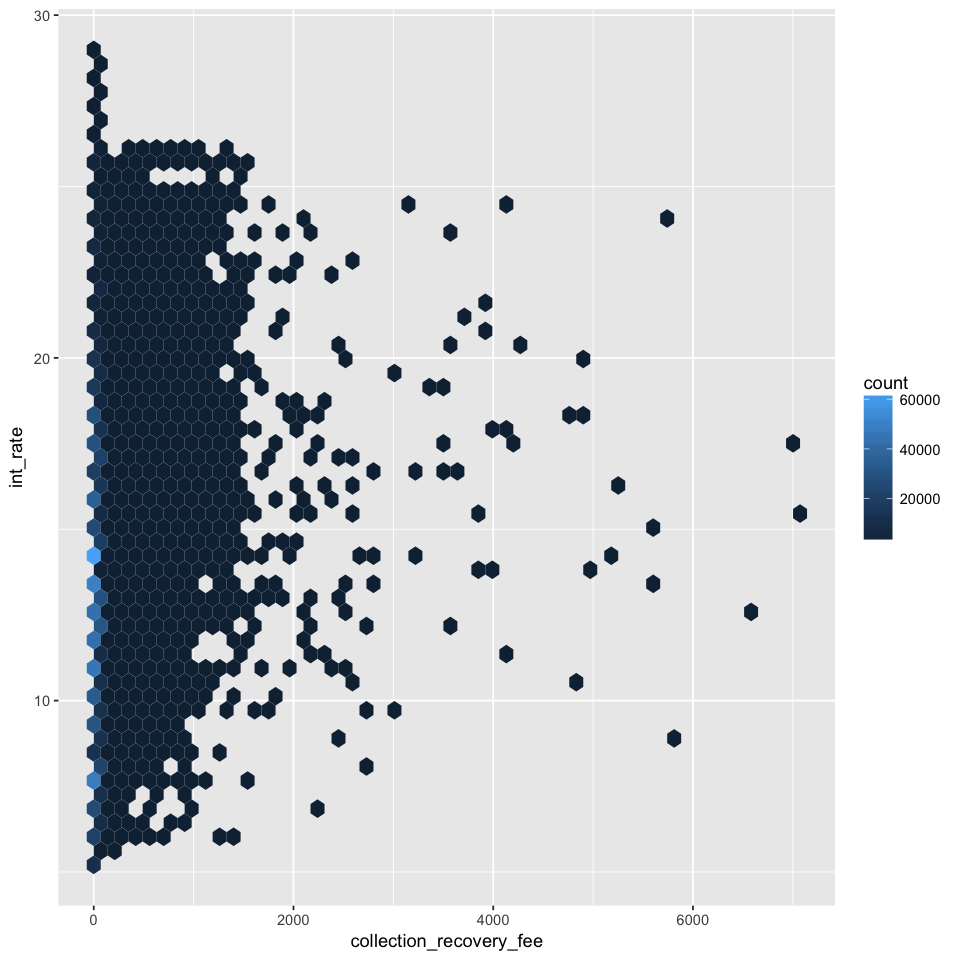

In [137]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(loan, aes(x=collection_recovery_fee, y=int_rate)) + geom_hex(bins=50) #+ stat_smooth(method=lm)

### 62. out_prncp
out_prncp : Remaining outstanding principal for total amount funded

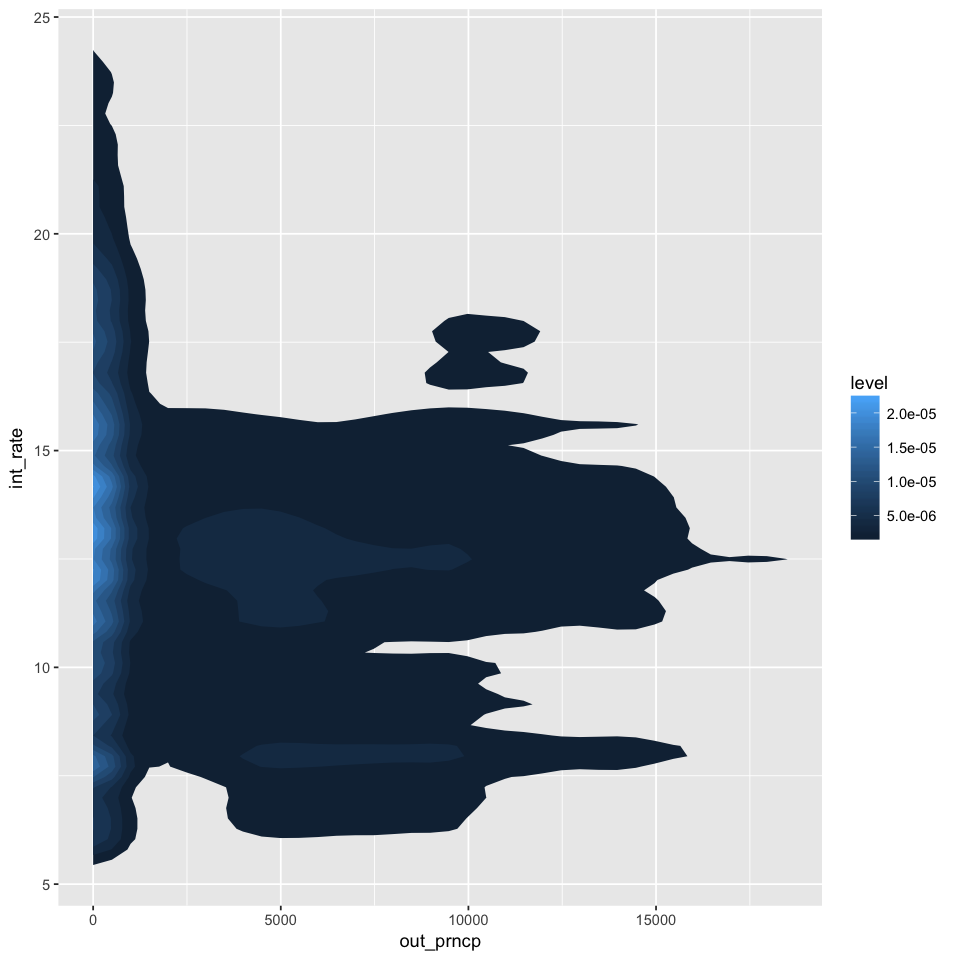

In [138]:
ggplot(loan, aes(x=out_prncp, y=int_rate)) + 
stat_density_2d(aes(fill = ..level..), geom = "polygon")

In [139]:
# keep one is enough
cor(loan$out_prncp, loan$out_prncp_inv)

[1] 0.9999972

### Correlation plot for numerical features

corrplot 0.84 loaded
Warning message in cor(loan[, num_var], use = "complete.obs"):
“the standard deviation is zero”

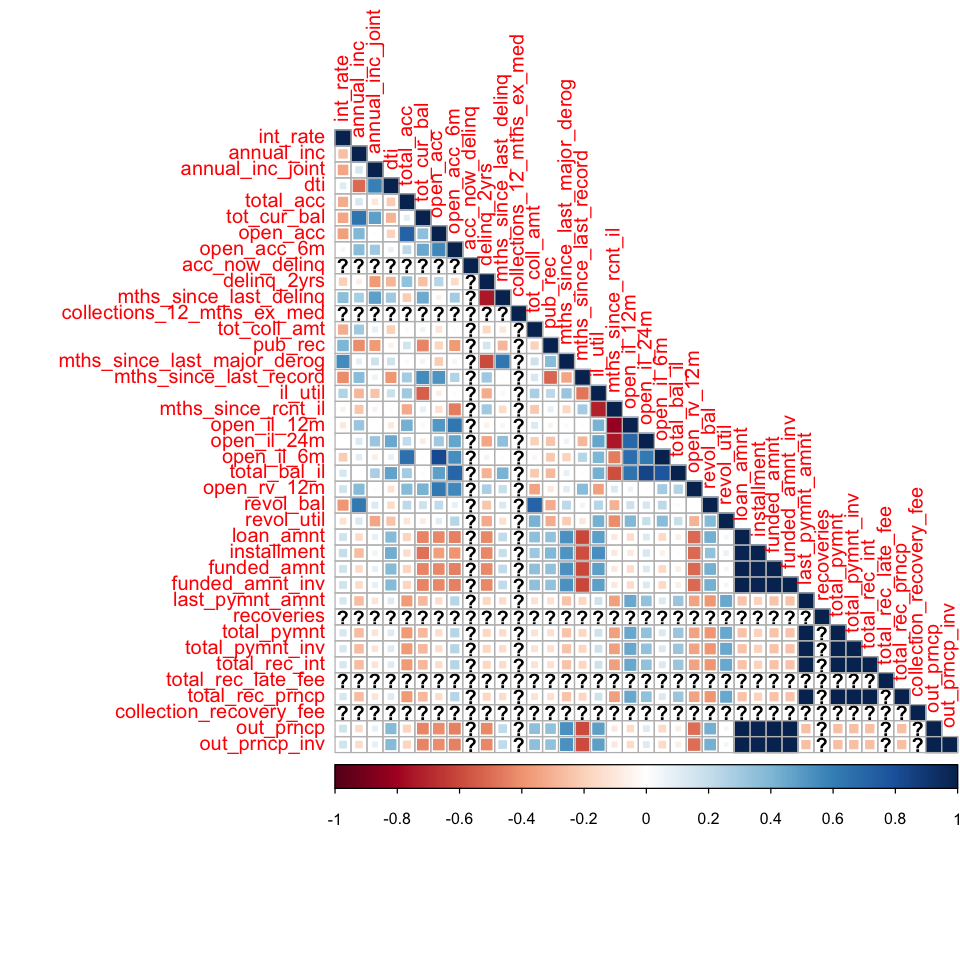

In [140]:
num_var=c("int_rate","annual_inc","annual_inc_joint","dti",'total_acc','tot_cur_bal','open_acc','open_acc_6m',
          'acc_now_delinq','delinq_2yrs','mths_since_last_delinq','collections_12_mths_ex_med','tot_coll_amt',
          'pub_rec','mths_since_last_major_derog','mths_since_last_record','il_util','mths_since_rcnt_il',
          'open_il_12m','open_il_24m','open_il_6m','total_bal_il','open_rv_12m','revol_bal','revol_util',
          'loan_amnt','installment','funded_amnt','funded_amnt_inv','last_pymnt_amnt','recoveries','total_pymnt',
          'total_pymnt_inv','total_rec_int','total_rec_late_fee','total_rec_prncp','collection_recovery_fee',
          'out_prncp','out_prncp_inv')
#Plot the correlation matrix
library(corrplot)
correlations <- cor(loan[, num_var],use="complete.obs")
#print(correlations)
corrplot(correlations, method = "square", tl.cex = 1, type = 'lower')


## missing value treatment 
	•	Remove features with too many missing value, or remove all rows with NA if you have a lot of data
	•	If not missing at random, add new level to represent NA, impute with 0, or generate new feature.
	•	If missing at random, imputation using summary stats or modeling way.

In [141]:
colnames(loan)

[1] "id"                          "member_id"                  
  [3] "loan_amnt"                   "funded_amnt"                
  [5] "funded_amnt_inv"             "term"                       
  [7] "int_rate"                    "installment"                
  [9] "grade"                       "sub_grade"                  
 [11] "emp_title"                   "emp_length"                 
 [13] "home_ownership"              "annual_inc"                 
 [15] "verification_status"         "issue_d"                    
 [17] "loan_status"                 "pymnt_plan"                 
 [19] "url"                         "desc"                       
 [21] "purpose"                     "title"                      
 [23] "zip_code"                    "addr_state"                 
 [25] "dti"                         "delinq_2yrs"                
 [27] "earliest_cr_line"            "inq_last_6mths"             
 [29] "mths_since_last_delinq"      "mths_since_last_record"     
 [31] "open_acc"                    "pub_rec"                    
 [33] "revol_bal"                   "revol_util"                 
 [35] "total_acc"                   "initial_list_status"        
 [37] "out_prncp"                   "out_prncp_inv"              
 [39] "total_pymnt"                 "total_pymnt_inv"            
 [41] "total_rec_prncp"             "total_rec_int"              
 [43] "total_rec_late_fee"          "recoveries"                 
 [45] "collection_recovery_fee"     "last_pymnt_d"               
 [47] "last_pymnt_amnt"             "next_pymnt_d"               
 [49] "last_credit_pull_d"          "collections_12_mths_ex_med" 
 [51] "mths_since_last_major_derog" "policy_code"                
 [53] "application_type"            "annual_inc_joint"           
 [55] "dti_joint"                   "verification_status_joint"  
 [57] "acc_now_delinq"              "tot_coll_amt"               
 [59] "tot_cur_bal"                 "open_acc_6m"                
 [61] "open_il_6m"                  "open_il_12m"                
 [63] "open_il_24m"                 "mths_since_rcnt_il"         
 [65] "total_bal_il"                "il_util"                    
 [67] "open_rv_12m"                 "open_rv_24m"                
 [69] "max_bal_bc"                  "all_util"                   
 [71] "total_rev_hi_lim"            "inq_fi"                     
 [73] "total_cu_tl"                 "inq_last_12m"               
 [75] "earliest_cr_line_date"       "earliest_cr_line_year"      
 [77] "earliest_cr_line_mon"        "last_credit_pull_d_date"    
 [79] "last_credit_pull_d_year"     "last_credit_pull_d_mon"     
 [81] "issue_d_date"                "issue_d_year"               
 [83] "issue_d_mon"                 "last_pymnt_d_date"          
 [85] "last_pymnt_d_year"           "last_pymnt_d_mon"           
 [87] "next_pymnt_d_date"           "next_pymnt_d_year"          
 [89] "next_pymnt_d_mon"            "emp_length_sim"             
 [91] "gen_home_ownership"          "gen_add_state_zip"          
 [93] "gen_add_state_zip_ave_rate"  "gen_log_annual_inc"         
 [95] "gen_inq_last_6mths"          "gen_log_tot_cur_bal"        
 [97] "gen_log_tot_coll_amt"        "gen_log_total_rev_hi_lim"   
 [99] "gen_issue_d"                 "gen_issue_year"             
[101] "gen_issue_mon"               "gen_log_loan_amnt"

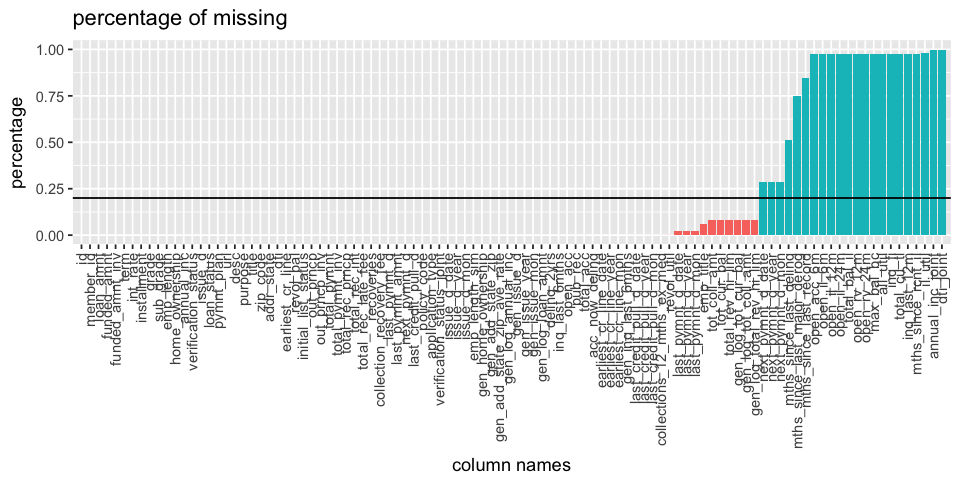

In [142]:
num.NA <- sort(colSums(sapply(loan, is.na)))

dfnum.NA <- data.frame(ind = c(1:length(num.NA)),
                       percentage = num.NA/nrow(loan),
                       per80 = num.NA/nrow(loan)>=0.2,
                           name = names(num.NA),
                       row.names = NULL) # convert to data.frame

options(repr.plot.width=8, repr.plot.height=4)
ggplot(data = dfnum.NA, aes(x=ind, y=percentage)) + 
  geom_bar(aes(fill=per80), stat="identity") + 
  scale_x_discrete(name ="column names", 
                   limits=dfnum.NA$name)+
  theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none") +
  geom_hline(yintercept = 0.2) + 
  ggtitle("percentage of missing")

In [143]:
loan_cp=loan
# drop missing > 80%
dfnum.NA$name[dfnum.NA$per80]
loan[, as.character(dfnum.NA$name[dfnum.NA$per80])] <- NULL

[1] next_pymnt_d_date           next_pymnt_d_year          
 [3] next_pymnt_d_mon            mths_since_last_delinq     
 [5] mths_since_last_major_derog mths_since_last_record     
 [7] open_acc_6m                 open_il_6m                 
 [9] open_il_12m                 open_il_24m                
[11] total_bal_il                open_rv_12m                
[13] open_rv_24m                 max_bal_bc                 
[15] all_util                    inq_fi                     
[17] total_cu_tl                 inq_last_12m               
[19] mths_since_rcnt_il          il_util                    
[21] annual_inc_joint            dti_joint                  
102 Levels: acc_now_delinq addr_state all_util annual_inc ... zip_code

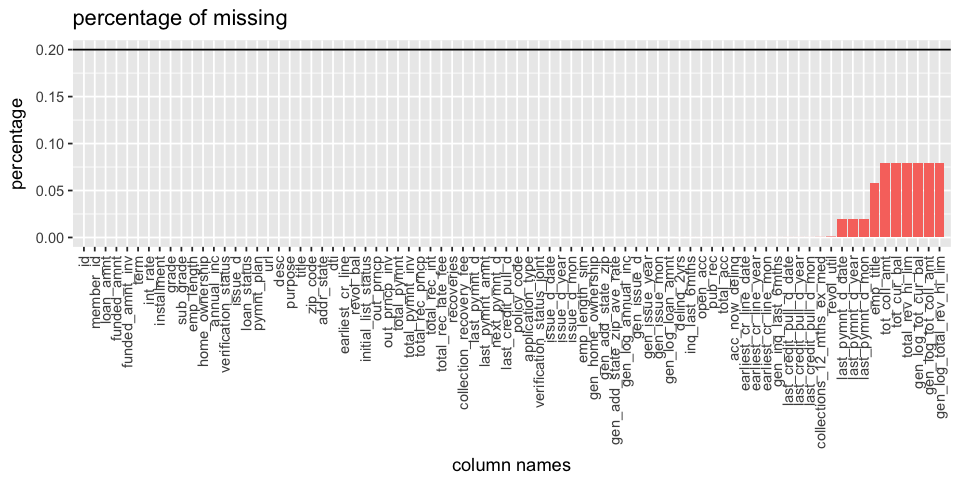

In [144]:
num.NA <- sort(colSums(sapply(loan, is.na)))

dfnum.NA <- data.frame(ind = c(1:length(num.NA)),
                       percentage = num.NA/nrow(loan),
                       per80 = num.NA/nrow(loan)>=0.2,
                           name = names(num.NA),
                       row.names = NULL) # convert to data.frame

options(repr.plot.width=8, repr.plot.height=4)
ggplot(data = dfnum.NA, aes(x=ind, y=percentage)) + 
  geom_bar(aes(fill=per80), stat="identity") + 
  scale_x_discrete(name ="column names", 
                   limits=dfnum.NA$name)+
  theme(axis.text.x = element_text(angle=90, hjust=1, vjust=.5),
        legend.position = "none") +
  geom_hline(yintercept = 0.2) + 
  ggtitle("percentage of missing")

In [145]:
num.NA <- sort(sapply(loan, function(x) { sum(is.na(x))} ), decreasing = TRUE)
num.NA

tot_coll_amt                tot_cur_bal 
                     70276                      70276 
          total_rev_hi_lim        gen_log_tot_cur_bal 
                     70276                      70276 
      gen_log_tot_coll_amt   gen_log_total_rev_hi_lim 
                     70276                      70276 
                 emp_title          last_pymnt_d_date 
                     51457                      17659 
         last_pymnt_d_year           last_pymnt_d_mon 
                     17659                      17659 
                revol_util collections_12_mths_ex_med 
                       502                        145 
   last_credit_pull_d_date    last_credit_pull_d_year 
                        53                         53 
    last_credit_pull_d_mon                delinq_2yrs 
                        53                         29 
            inq_last_6mths                   open_acc 
                        29                         29 
                   pub_rec                  total_acc 
                        29                         29 
            acc_now_delinq      earliest_cr_line_date 
                        29                         29 
     earliest_cr_line_year       earliest_cr_line_mon 
                        29                         29 
        gen_inq_last_6mths                         id 
                        29                          0 
                 member_id                  loan_amnt 
                         0                          0 
               funded_amnt            funded_amnt_inv 
                         0                          0 
                      term                   int_rate 
                         0                          0 
               installment                      grade 
                         0                          0 
                 sub_grade                 emp_length 
                         0                          0 
            home_ownership                 annual_inc 
                         0                          0 
       verification_status                    issue_d 
                         0                          0 
               loan_status                 pymnt_plan 
                         0                          0 
                       url                       desc 
                         0                          0 
                   purpose                      title 
                         0                          0 
                  zip_code                 addr_state 
                         0                          0 
                       dti           earliest_cr_line 
                         0                          0 
                 revol_bal        initial_list_status 
                         0                          0 
                 out_prncp              out_prncp_inv 
                         0                          0 
               total_pymnt            total_pymnt_inv 
                         0                          0 
           total_rec_prncp              total_rec_int 
                         0                          0 
        total_rec_late_fee                 recoveries 
                         0                          0 
   collection_recovery_fee               last_pymnt_d 
                         0                          0 
           last_pymnt_amnt               next_pymnt_d 
                         0                          0 
        last_credit_pull_d                policy_code 
                         0                          0 
          application_type  verification_status_joint 
                         0                          0 
              issue_d_date               issue_d_year 
                         0                          0 
               issue_d_mon             emp_length_sim 
                         0                          0 
        gen_home_ownership          gen_add_state_zip 

In [146]:
for(col.i in names(num.NA)[which(num.NA > 0)]) {
  loan[which(is.na(loan[, col.i])), col.i] <- median(loan[, col.i], na.rm = T)}

Warning message in mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]):
“argument is not numeric or logical: returning NA”Warning message in mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]):
“argument is not numeric or logical: returning NA”Warning message in mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]):
“argument is not numeric or logical: returning NA”Warning message in mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]):
“argument is not numeric or logical: returning NA”Warning message in mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]):
“argument is not numeric or logical: returning NA”Warning message in mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]):
“argument is not numeric or logical: returning NA”Warning message in mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]):
“argument is not numeric or logical: returning NA”

## feature variance¶



In [147]:
apply(loan, 2, function(x){length(unique(x))})

id                  member_id 
                    887379                     887379 
                 loan_amnt                funded_amnt 
                      1372                       1372 
           funded_amnt_inv                       term 
                      9729                          2 
                  int_rate                installment 
                       542                      68711 
                     grade                  sub_grade 
                         7                         35 
                 emp_title                 emp_length 
                    261562                         10 
            home_ownership                 annual_inc 
                         6                      49384 
       verification_status                    issue_d 
                         3                        103 
               loan_status                 pymnt_plan 
                        10                          2 
                       url                       desc 
                    887379                     124471 
                   purpose                      title 
                        14                      53298 
                  zip_code                 addr_state 
                       935                         51 
                       dti                delinq_2yrs 
                      4086                         29 
          earliest_cr_line             inq_last_6mths 
                       698                         28 
                  open_acc                    pub_rec 
                        77                         32 
                 revol_bal                 revol_util 
                     73740                       1356 
                 total_acc        initial_list_status 
                       135                          2 
                 out_prncp              out_prncp_inv 
                    248332                     266244 
               total_pymnt            total_pymnt_inv 
                    503828                     506616 
           total_rec_prncp              total_rec_int 
                    260227                     324635 
        total_rec_late_fee                 recoveries 
                      6114                      23055 
   collection_recovery_fee               last_pymnt_d 
                     20414                         99 
           last_pymnt_amnt               next_pymnt_d 
                    232451                        101 
        last_credit_pull_d collections_12_mths_ex_med 
                       104                         12 
               policy_code           application_type 
                         1                          2 
 verification_status_joint             acc_now_delinq 
                         4                          8 
              tot_coll_amt                tot_cur_bal 
                     10325                     327342 
          total_rev_hi_lim      earliest_cr_line_date 
                     21251                        697 
     earliest_cr_line_year       earliest_cr_line_mon 
                        68                         13 
   last_credit_pull_d_date    last_credit_pull_d_year 
                       103                         11 
    last_credit_pull_d_mon               issue_d_date 
                        13                        103 
              issue_d_year                issue_d_mon 
                         9                         12 
         last_pymnt_d_date          last_pymnt_d_year 
                        98                         11 
          last_pymnt_d_mon             emp_length_sim 
                        13                          2 
        gen_home_ownership          gen_add_state_zip 
                         4                       1985 
gen_add_state_zip_ave_rate         gen_log_annual_inc 
                       353                      49249 
        gen_inq_last_6mths        gen_log_tot_cur_bal 
         

In [148]:
# remove all unique and single
loan[, c("id", "member_id", "url", "desc")] <- NULL

In [149]:
# drop loan payment features
loan[, c("installment", "funded_amnt", "funded_amnt_inv",
         "last_pymnt_amnt", "last_pymnt_d", "next_pymnt_d", 'gen_add_state_zip',
         "pymnt_plan", "recoveries", "total_pymnt", "verification_status", 'verification_status_joint',
         "total_pymnt_inv", "total_rec_int", "total_rec_late_fee",
         "total_rec_prncp", "collection_recovery_fee", "out_prncp", "out_prncp_inv")] <- NULL

In [150]:
# drop potential response variables
loan[, c("grade", "sub_grade", "loan_status")] <- NULL

In [151]:
colnames(loan)

[1] "loan_amnt"                  "term"                      
 [3] "int_rate"                   "emp_title"                 
 [5] "emp_length"                 "home_ownership"            
 [7] "annual_inc"                 "issue_d"                   
 [9] "purpose"                    "title"                     
[11] "zip_code"                   "addr_state"                
[13] "dti"                        "delinq_2yrs"               
[15] "earliest_cr_line"           "inq_last_6mths"            
[17] "open_acc"                   "pub_rec"                   
[19] "revol_bal"                  "revol_util"                
[21] "total_acc"                  "initial_list_status"       
[23] "last_credit_pull_d"         "collections_12_mths_ex_med"
[25] "policy_code"                "application_type"          
[27] "acc_now_delinq"             "tot_coll_amt"              
[29] "tot_cur_bal"                "total_rev_hi_lim"          
[31] "earliest_cr_line_date"      "earliest_cr_line_year"     
[33] "earliest_cr_line_mon"       "last_credit_pull_d_date"   
[35] "last_credit_pull_d_year"    "last_credit_pull_d_mon"    
[37] "issue_d_date"               "issue_d_year"              
[39] "issue_d_mon"                "last_pymnt_d_date"         
[41] "last_pymnt_d_year"          "last_pymnt_d_mon"          
[43] "emp_length_sim"             "gen_home_ownership"        
[45] "gen_add_state_zip_ave_rate" "gen_log_annual_inc"        
[47] "gen_inq_last_6mths"         "gen_log_tot_cur_bal"       
[49] "gen_log_tot_coll_amt"       "gen_log_total_rev_hi_lim"  
[51] "gen_issue_d"                "gen_issue_year"            
[53] "gen_issue_mon"              "gen_log_loan_amnt"

In [152]:
# drop "zip_code", "addr_state", "earliest_cr_line", "policy_code"
loan[, c("zip_code", "addr_state", "policy_code", "earliest_cr_line")] <- NULL

In [156]:
# save the updated data
saveRDS(loan, file="loan_updated.Rda")

## build model¶


### Linear model

#### Model selection

In [179]:
# split data into train and test for model performance
set.seed(1)
loan.complete = loan[complete.cases(loan), ]
train.ind <- sample(1:dim(loan.complete)[1], 0.7 * dim(loan.complete)[1])
train <- loan.complete[train.ind, ]
test <- loan.complete[-train.ind, ]

In [180]:
mod <- lm(int_rate ~ loan_amnt + term + annual_inc + purpose + dti + delinq_2yrs + 
          inq_last_6mths + open_acc + pub_rec + revol_bal + revol_util + total_acc + 
          initial_list_status + collections_12_mths_ex_med + application_type + acc_now_delinq + 
          tot_coll_amt + tot_cur_bal + total_rev_hi_lim + emp_length_sim + 
          gen_home_ownership + gen_add_state_zip_ave_rate + gen_inq_last_6mths + 
          issue_d_date + gen_issue_year + gen_issue_mon
          ,data = train)
summary(mod)


Call:
lm(formula = int_rate ~ loan_amnt + term + annual_inc + purpose + 
    dti + delinq_2yrs + inq_last_6mths + open_acc + pub_rec + 
    revol_bal + revol_util + total_acc + initial_list_status + 
    collections_12_mths_ex_med + application_type + acc_now_delinq + 
    tot_coll_amt + tot_cur_bal + total_rev_hi_lim + emp_length_sim + 
    gen_home_ownership + gen_add_state_zip_ave_rate + gen_inq_last_6mths + 
    issue_d_date + gen_issue_year + gen_issue_mon, data = train)

Residuals:
    Min      1Q  Median      3Q     Max 
-30.456  -2.269  -0.272   2.001 155.436 

Coefficients:
                             Estimate Std. Error  t value Pr(>|t|)    
(Intercept)                -2.032e+04  7.773e+02  -26.144  < 2e-16 ***
loan_amnt                   3.997e-05  6.277e-07   63.671  < 2e-16 ***
term 60 months              4.040e+00  1.031e-02  391.693  < 2e-16 ***
annual_inc                 -2.611e-06  7.245e-08  -36.037  < 2e-16 ***
purposecredit_card         -1.339e+00  4.376e-02  -30.

In [199]:
#plot(mod)

In [183]:
# remove extreme outliers
train.sub = train[-which(rownames(train) %in% c(534801, 755747, 301371)), ]


In [184]:
mod2 <- lm(int_rate ~ loan_amnt + term + annual_inc + purpose + dti + delinq_2yrs + 
          inq_last_6mths + open_acc + pub_rec + revol_bal + revol_util + total_acc + 
          initial_list_status + collections_12_mths_ex_med + application_type + acc_now_delinq + 
          tot_coll_amt + tot_cur_bal + total_rev_hi_lim + emp_length_sim + 
          gen_home_ownership + gen_add_state_zip_ave_rate + gen_inq_last_6mths + 
          issue_d_date + gen_issue_year + gen_issue_mon
          ,data = train.sub)
summary(mod2)


Call:
lm(formula = int_rate ~ loan_amnt + term + annual_inc + purpose + 
    dti + delinq_2yrs + inq_last_6mths + open_acc + pub_rec + 
    revol_bal + revol_util + total_acc + initial_list_status + 
    collections_12_mths_ex_med + application_type + acc_now_delinq + 
    tot_coll_amt + tot_cur_bal + total_rev_hi_lim + emp_length_sim + 
    gen_home_ownership + gen_add_state_zip_ave_rate + gen_inq_last_6mths + 
    issue_d_date + gen_issue_year + gen_issue_mon, data = train.sub)

Residuals:
    Min      1Q  Median      3Q     Max 
-30.365  -2.262  -0.268   1.994 205.353 

Coefficients:
                             Estimate Std. Error t value Pr(>|t|)    
(Intercept)                -2.043e+04  7.752e+02 -26.354  < 2e-16 ***
loan_amnt                   4.263e-05  6.278e-07  67.907  < 2e-16 ***
term 60 months              4.026e+00  1.029e-02 391.343  < 2e-16 ***
annual_inc                 -2.579e-06  7.226e-08 -35.694  < 2e-16 ***
purposecredit_card         -1.328e+00  4.364e-02 -30.42

In [186]:
train.sub2 = train.sub[-which(rownames(train.sub) %in% c(52576)), ]
mod3 <- lm(int_rate ~ loan_amnt + term + annual_inc + purpose + dti + delinq_2yrs + I(loan_amnt^2) +
           inq_last_6mths + open_acc + pub_rec + revol_bal + revol_util + total_acc +  sqrt(annual_inc) +
           initial_list_status + collections_12_mths_ex_med + application_type + acc_now_delinq + 
           tot_coll_amt + tot_cur_bal + total_rev_hi_lim + emp_length_sim + 
           gen_home_ownership + gen_add_state_zip_ave_rate + gen_inq_last_6mths + 
           issue_d_date
           ,data = train.sub2)
summary(mod3)
#plot(mod3)


Call:
lm(formula = int_rate ~ loan_amnt + term + annual_inc + purpose + 
    dti + delinq_2yrs + I(loan_amnt^2) + inq_last_6mths + open_acc + 
    pub_rec + revol_bal + revol_util + total_acc + sqrt(annual_inc) + 
    initial_list_status + collections_12_mths_ex_med + application_type + 
    acc_now_delinq + tot_coll_amt + tot_cur_bal + total_rev_hi_lim + 
    emp_length_sim + gen_home_ownership + gen_add_state_zip_ave_rate + 
    gen_inq_last_6mths + issue_d_date, data = train.sub2)

Residuals:
    Min      1Q  Median      3Q     Max 
-31.186  -2.247  -0.241   1.985 194.366 

Coefficients:
                             Estimate Std. Error  t value Pr(>|t|)    
(Intercept)                 1.016e+01  2.232e-01   45.519  < 2e-16 ***
loan_amnt                  -1.445e-04  2.107e-06  -68.561  < 2e-16 ***
term 60 months              4.020e+00  1.046e-02  384.376  < 2e-16 ***
annual_inc                  6.710e-06  1.178e-07   56.943  < 2e-16 ***
purposecredit_card         -8.300e-01  4.387e-

In [187]:
library(car)
vif(mod3)

Warning message:
“package ‘car’ was built under R version 3.4.3”

,GVIF,Df,GVIF^(1/(2*Df))
loan_amnt,17.504391,1,4.183825
term,1.290695,1,1.136088
annual_inc,3.542260,1,1.882089
purpose,1.245792,13,1.008489
dti,1.453904,1,1.205780
delinq_2yrs,1.055798,1,1.027520
I(loan_amnt^2),15.978649,1,3.997330
inq_last_6mths,67.268650,1,8.201747
open_acc,2.208085,1,1.485963
pub_rec,1.051256,1,1.025308


In [188]:
mod4 <- lm(int_rate ~ loan_amnt + term + annual_inc + purpose + dti + delinq_2yrs + I(loan_amnt^2) +
        open_acc + pub_rec + revol_bal + revol_util + total_acc +  sqrt(annual_inc) +
           initial_list_status + collections_12_mths_ex_med + application_type + acc_now_delinq + 
           tot_coll_amt + tot_cur_bal + total_rev_hi_lim + emp_length_sim + 
           gen_home_ownership + gen_add_state_zip_ave_rate + issue_d_date
           ,data = train.sub2)
summary(mod4)
#plot(mod3)


Call:
lm(formula = int_rate ~ loan_amnt + term + annual_inc + purpose + 
    dti + delinq_2yrs + I(loan_amnt^2) + open_acc + pub_rec + 
    revol_bal + revol_util + total_acc + sqrt(annual_inc) + initial_list_status + 
    collections_12_mths_ex_med + application_type + acc_now_delinq + 
    tot_coll_amt + tot_cur_bal + total_rev_hi_lim + emp_length_sim + 
    gen_home_ownership + gen_add_state_zip_ave_rate + issue_d_date, 
    data = train.sub2)

Residuals:
    Min      1Q  Median      3Q     Max 
-38.355  -2.393  -0.279   2.083 206.165 

Coefficients:
                             Estimate Std. Error  t value Pr(>|t|)    
(Intercept)                 1.470e+01  2.332e-01   63.062  < 2e-16 ***
loan_amnt                  -1.634e-04  2.211e-06  -73.889  < 2e-16 ***
term 60 months              4.089e+00  1.098e-02  372.422  < 2e-16 ***
annual_inc                  6.309e-06  1.237e-07   50.992  < 2e-16 ***
purposecredit_card         -8.247e-01  4.606e-02  -17.904  < 2e-16 ***
purposedebt_c

#### Using glmnet to generate linear model

In [189]:
# split data into train and test for model performance
set.seed(1)
loan.complete = loan[complete.cases(loan), ]

selected_features = c("loan_amnt", "annual_inc", "dti", "delinq_2yrs", "open_acc",
                      "pub_rec", "revol_bal", "revol_util", "total_acc", 
                      "tot_coll_amt", "tot_cur_bal", "total_rev_hi_lim", "gen_annual_inc_sqrt", 
                      "gen_add_state_zip_ave_rate", "int_rate", "gen_loan_amnt_square")
# generate nonlinear features
loan.complete$gen_loan_amnt_square = loan.complete$loan_amnt^2
loan.complete$gen_annual_inc_sqrt = sqrt(loan.complete$annual_inc)

# generate dummy variables
dummy.variable = model.matrix(~purpose + term + gen_home_ownership + 
                              collections_12_mths_ex_med + 
                              acc_now_delinq + emp_length_sim - 1, loan.complete)

# numerical variable
num.variable = as.matrix(loan.complete[, selected_features])

# combine dummy with loan data
loan.sim = cbind(num.variable, dummy.variable)

train.ind <- sample(1:dim(loan.complete)[1], 0.7 * dim(loan.complete)[1])

train <- loan.sim[train.ind, ]
test <- loan.sim[-train.ind, ]

In [190]:
library(glmnet)

In [191]:
which(colnames(train)=='int_rate')

[1] 15

In [192]:
train.feature = train[, -15]
train.label = train[, 15]
test.feature = test[, -15]
test.label = test[, 15]

save(train.feature, file = "train_feature.Rdata")
save(train.label, file = "train_label.Rdata")
save(test.feature, file = "test_feature.Rdata")
save(test.label, file = "test_label.Rdata")

In [193]:
colnames(train.feature)

[1] "loan_amnt"                  "annual_inc"                
 [3] "dti"                        "delinq_2yrs"               
 [5] "open_acc"                   "pub_rec"                   
 [7] "revol_bal"                  "revol_util"                
 [9] "total_acc"                  "tot_coll_amt"              
[11] "tot_cur_bal"                "total_rev_hi_lim"          
[13] "gen_annual_inc_sqrt"        "gen_add_state_zip_ave_rate"
[15] "gen_loan_amnt_square"       "purposecar"                
[17] "purposecredit_card"         "purposedebt_consolidation" 
[19] "purposeeducational"         "purposehome_improvement"   
[21] "purposehouse"               "purposemajor_purchase"     
[23] "purposemedical"             "purposemoving"             
[25] "purposeother"               "purposerenewable_energy"   
[27] "purposesmall_business"      "purposevacation"           
[29] "purposewedding"             "term 60 months"            
[31] "gen_home_ownershipothers"   "gen_home_ownershipOWN"     
[33] "gen_home_ownershipRENT"     "collections_12_mths_ex_med"
[35] "acc_now_delinq"             "emp_length_sim>= 5"

In [194]:
mod.glmnet <- glmnet(x=train.feature, y=train.label)


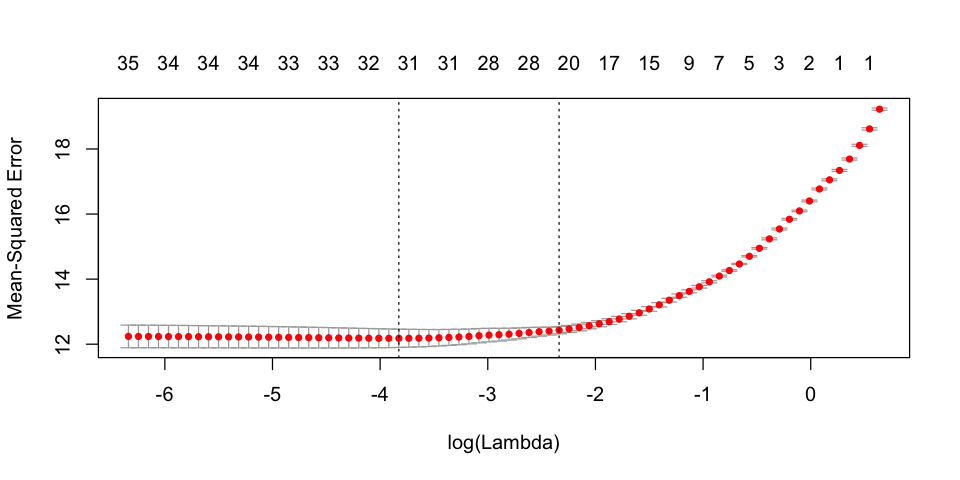

In [195]:
cvfit <- cv.glmnet(train.feature, train.label)
plot(cvfit)

In [177]:
# predict result with minimum mean cross-validated error
glm.pred = predict(cvfit, newx = test.feature, s = "lambda.min")

In [178]:
# cross validation result : root mean square error

mean((glm.pred - test.label)^2)^0.5

[1] 3.447345